In [1]:
import scanpy as sc
import squidpy as sq
import numpy as np
import scipy as sp

import pandas as pd
import copy

import os
import seaborn as sns
import matplotlib.pyplot as plt

/gstore/home/fooc5/pyenvs/squidpy_env/lib/python3.10/site-packages/cupy/_environment.py:361: UserWarning: CuPy failed to preload library (/gstore/home/fooc5/.cupy/cuda_lib/11.x/cutensor/1.6.2/lib/libcutensor.so.1.6.2): OSError (libcublasLt.so.11: cannot open shared object file: No such file or directory)
  warnings.warn(msg)
/gstore/home/fooc5/pyenvs/squidpy_env/lib/python3.10/site-packages/numba/core/cpu.py:99: UserWarning: Numba extension module 'sparse._numba_extension' failed to load due to 'ModuleNotFoundError(No module named 'numba.targets')'.
  numba.core.entrypoints.init_all()


In [2]:
import warnings
warnings.filterwarnings('ignore')

In [36]:
d_path = '/gne/data/omerobox/Data_transfer/Zhen_MERFISH/VS9_HuLungCa_HF-106315_VS9Library_V11_LH_06-04-2021/region_0/'
s_path = '/gne/data/t3imagedata/conrad_store/VS9_HuLungCa_HF-106315_VS9Library_V11_LH_06-04-2021/'

In [25]:
#Sample MERFISH data from SPEX publication. Let's use this as test data.
d_path = '/gne/data/omerobox/Data_transfer/Zhen_MERFISH/VS9_HuLungCa_HF-106315_VS9Library_V11_LH_06-04-2021/region_0/'
#d_path = '/workspace/ST/HuLung_VS9/'
test_adata = sq.read.vizgen(d_path, counts_file='cell_by_gene.csv', meta_file='cell_metadata.csv')
#test_adata.uns['batch_key'] = 'fov'

gdat = sc.read_h5ad('/gne/data/t3imagedata/conrad_store/VS9_HuLungCa_HF-106315_VS9Library_V11_LH_06-04-2021/SPEX_MERFISH_Lung.h5ad')
gdat.obsm['spatial'] = np.stack([gdat.obs.x,gdat.obs.y]).T
gdat.obsm['spatial'] = gdat.obsm['spatial'].astype('float')

#Load tonsil data (file in CLQ notebook)

# Old version

In [196]:
#Preprocessing module.
def preprocess(adata,scale_max = 10, auto_scale = True, size_factor = 1e4, do_QC = False, blank_percent=95):
    #Args:
    #adata : Anndata with cell x gene matrix.
    #scale_max : Maximum number of std away from mean (clip larger values to this number)
    #auto_scale : Whether we fit the overdispersion from the data or use a fixed size factor
    #size_factor : The set size factor if we aren't autoscaling (default to counts per mill)
    #do_QC : Whether or not we filter out "outlier" cells with high total counts and number of expressed genes.

    sc.pp.filter_cells(adata, min_genes=2)
    sc.pp.filter_genes(adata, min_cells=2)

    if do_QC:
        #Total counts, number of genes by counts
        sc.pp.calculate_qc_metrics(adata,percent_top=None,log1p=False,inplace=True)

        adata = adata[adata.obs.n_genes_by_counts < MAD_threshold(adata.obs.n_genes_by_counts),:]
        adata = adata[adata.obs.total_counts < MAD_threshold(adata.obs.total_counts),:]
        
        #Use blank gene counts to filter.
        if 'blank_genes' in adata.obsm:
            n_blanks_per_cell = adata.obsm['blank_genes'].sum(1)
            blank_thresh = np.percentile(n_blanks_per_cell,blank_percent)
            adata.uns['blank_threshold'] = blank_thresh

            adata = adata[adata.obs.total_counts > blank_thresh,:]

    if auto_scale:
        #Estimate mean-variance relationship across genes to determine overdispersion.
        nbf = lambda x,a: x + a*(x**2)
        alpha,_ = sp.optimize.curve_fit(nbf,np.array(adata.X.mean(0)).squeeze(),np.array(adata.X.todense().var(0)).squeeze(),bounds=(0,np.inf))
        offset = 1/(4*alpha)

        #Do the log transform.
        adata.raw = adata
        adata.X = np.log(adata.X/offset + 1)
        adata.X = sp.sparse.csr_array(adata.X)
    else:
        adata.raw = adata
        sc.pp.normalize_total(adata,target_sum=size_factor)
        sc.pp.log1p(adata)
        adata.uns['log1p']['base'] = None
    
    #Annotate highly variable genes
    sc.pp.highly_variable_genes(adata)

    #Z-transform data and truncate.
    sc.pp.scale(adata, max_value=scale_max)

    return adata

In [197]:
adata = preprocess(copy.deepcopy(test_adata),auto_scale=True,do_QC=True)

/local/6634483/ipykernel_21369/854189537.py:24: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns['blank_threshold'] = blank_thresh


In [193]:
#This function reduces dimensionality of transcriptomic data and constructs a k-NN graph.
def reduce_dimensionality(adata, auto_neighbors=True, n_neighbors=15, latent_dim=32, method='pca'):
    #Args:
    #adata: AnnData (after preprocessing)
    #latent_dim: Number of components/dimensions
    #method: Either PCA or scVI

    if auto_neighbors:
        n_neighbors = int(np.round(np.sqrt(adata.shape[0])))

    if method=='scvi':
        counts = adata.raw.to_adata()
        counts.layers['counts'] = counts.X

        scvi.model.SCVI.setup_anndata(counts, layer='counts')
        vae = scvi.model.SCVI(counts, n_layers=2, n_latent=latent_dim, gene_likelihood='nb')
        vae.train()

        adata.obsm['X_scvi'] = vae.get_latent_representation()

    elif method=='pca' or method=='diff_map':
        print('Doing PCA...')
        sc.pp.pca(adata, n_comps=latent_dim)

    #Use pegasus to run diffusion map.
    if method=='diff_map':
        pdat = UnimodalData(copy.deepcopy(adata))
        pg.neighbors(pdat, K=n_neighbors, rep='pca')
        pg.diffmap(pdat, n_components=latent_dim)

        adata.obsm['X_diffmap'] = pdat.obsm['X_diffmap']
        adata.uns['diffmap_evals'] = pdat.uns['diffmap_evals']

    else:
        sc.pp.neighbors(adata,n_neighbors,use_rep='X_' + method)

    return adata

In [198]:
#adata = adata[:,adata.var.highly_variable]
adata = adata[adata[:,adata.var.highly_variable].X.sum(1) > adata.uns['blank_threshold'],:]

#adata = reduce_dimensionality(adata,method='pca',latent_dim=50)

In [113]:
sc.tl.leiden(adata)
sc.tl.umap(adata)

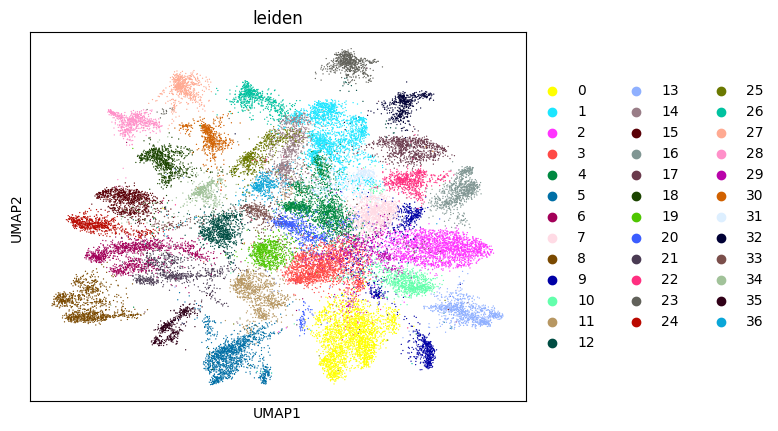

In [114]:
sc.pl.umap(adata,color='leiden')

In [200]:
pdat = UnimodalData(adata)

pg.pca(pdat,n_components=5,features=None)
pg.neighbors(pdat,K=int(np.round(np.sqrt(adata.shape[0]))))
pg.umap(pdat)

2023-06-05 04:10:59,906 - pegasus.tools.preprocessing - INFO - Function 'pca' finished in 6.32s.
2023-06-05 04:11:04,601 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 4.69s.
2023-06-05 04:11:06,590 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 1.99s.
2023-06-05 04:11:06,591 - pegasus.tools.nearest_neighbors - INFO - Found cached kNN results, no calculation is required.
2023-06-05 04:11:06,591 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 0.00s.
UMAP(min_dist=0.5, precomputed_knn=(array([[    0, 2898, 985, ..., 15580, 16394, 18777],
       [    1, 5739, 7905, ..., 1946, 33530, 804],
       [    2, 19047, 5263, ..., 17799, 23629, 3197],
       ...,
       [33938, 25842, 14008, ..., 16612, 1082, 3914],
       [33939, 10854, 13605, ..., 6104, 28839, 7913],
       [33940, 12459, 21310, ..., 28817, 19742, 6704]]), array([[0.        , 0.5553638 , 0.570371  , ..., 0.7578013 , 0.762

Epochs completed: 100%| ████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ 200/200 [00:43]

Mon Jun  5 04:11:55 2023 Finished embedding
2023-06-05 04:11:55,235 - pegasus.tools.visualization - INFO - Function 'umap' finished in 48.64s.


In [203]:
pg.cluster(pdat,algo='leiden')

2023-06-05 04:12:37,662 - pegasus.tools.graph_operations - INFO - Function 'construct_graph' finished in 3.10s.
2023-06-05 04:12:50,088 - pegasus.tools.clustering - INFO - Leiden clustering is done. Get 16 clusters.
2023-06-05 04:12:50,176 - pegasus.tools.clustering - INFO - Function 'leiden' finished in 15.62s.


In [206]:
adata.obsm['X_umap'] = pdat.obsm['X_umap']
adata.obs['leiden'] = pdat.obs['leiden_labels']

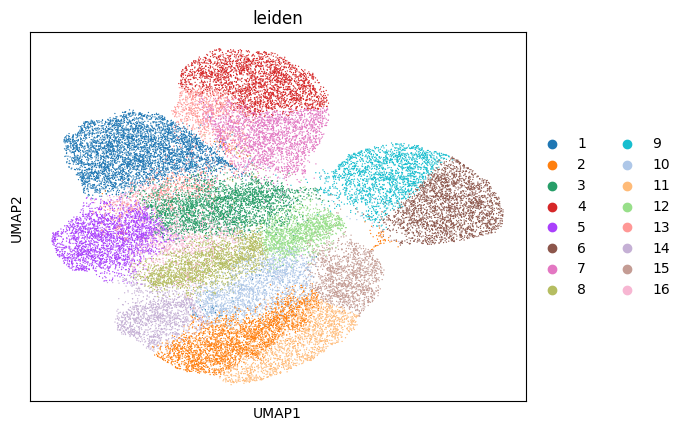

In [207]:
sc.pl.umap(adata,color='leiden')

# Helper functions

In [4]:
#Use the median absolute deviation (robust variance estimator) for outlier detection.
def MAD_threshold(variable,ndevs=2.5):
    mad = sp.stats.median_abs_deviation(variable,nan_policy='omit')
    return np.median(variable) - mad*ndevs

In [5]:
def should_batch_correct(adata):
    if 'batch_key' in adata.uns:
        if adata.uns['batch_key']:
            return True
    return False

In [6]:
def plot_joint_spatial_umap(adata, cvar='leiden', groups=None, **kwargs):
    f,a = plt.subplots(1,2)
    f.set_size_inches(10,5)

    if groups:
        sc.pl.umap(adata,color=cvar,ax=a[0],show=False,legend_loc=None,groups=groups,**kwargs)
        sq.pl.spatial_scatter(adata,color=cvar,ax=a[1],shape=None,groups=groups,**kwargs)
    else:
        sc.pl.umap(adata,color=cvar,ax=a[0],show=False,legend_loc=None,**kwargs)
        sq.pl.spatial_scatter(adata,color=cvar,ax=a[1],shape=None,**kwargs)

# Preprocessing/QC module

Here we are primariy focused on filtering out cells with bad measurement quality, normalizing, and variance stabilizing the data.

TODO: It is unclear to me whether all technologies utilize/give us access to negative probe counts, which would be useful to estimate background noise. I am primarily using this to threshold gene expression (which stabilizes the PCA later)

In [75]:
#Preprocessing module.
def preprocess(adata, scale_max = 10, size_factor = None, do_QC = False):
    #Args:
    #adata : Anndata with cell x gene matrix.
    #scale_max : Maximum number of std away from mean (clip larger values to this number)
    #size_factor : The set size factor (default to median library size)
    #do_QC : Whether or not we filter out "outlier" cells with high total counts and number of expressed genes.

    adata.uns['prepro'] = {}
    
    if 'blank_genes' in adata.obsm:
        print('Filtering on blank genes...')
        noise_floor = adata.obsm['blank_genes'].max(axis=1) #We assume that each "blank gene" is a n-bit barcode error and not a bit flip error.
        adata.obs['blank_counts'] = noise_floor

        adata.X = adata.X.tolil(copy=False)

        #Zero out all counts below the maximum blank gene count in the cell.
        #A more principled approach: for n blank genes, calculate distribution of FP counts per gene. 
        #Then we calculate P(count = obs.) for FP distribution and discard counts with P > 0.05
        cix,_ = adata.X.nonzero()
        for c in np.unique(cix):
            if noise_floor[c] < 1:
                continue
            crow = adata.X.getrowview(c)
            adata.X[c,:] = crow.multiply(crow > noise_floor[c])

        adata.X = adata.X.tocsr(copy=False)

    print('Excluding bad cells and genes (singletons)...')
    sc.pp.filter_cells(adata, min_genes=2)
    sc.pp.filter_genes(adata, min_cells=2)
    
    #Total counts, number of genes by counts
    sc.pp.calculate_qc_metrics(adata,percent_top=None,log1p=False,inplace=True)
    #Automatically exclude genes that have a low amount of transcripts.
    if do_QC:
        adata.uns['prepro']['total_count_thresh'] = MAD_threshold(adata.obs.total_counts,1)
        adata.uns['prepro']['n_genes_by_count_thresh'] = MAD_threshold(adata.obs.n_genes_by_counts,1.5)
        adata = adata[adata.obs.n_genes_by_counts > adata.uns['prepro']['n_genes_by_count_thresh'],:]
        adata = adata[adata.obs.total_counts > adata.uns['prepro']['total_count_thresh'],:]
    
    print('Normalizing data...')
    adata.raw = adata.copy()
    if pd.isnull(size_factor):
        adata.uns['prepro']['size_factor'] = np.median(adata.obs.total_counts)
        sc.pp.normalize_total(adata,target_sum=None)
    else:
        sc.pp.normalize_total(adata,target_sum=size_factor)
    
    sc.pp.log1p(adata)
    adata.uns['log1p']['base'] = None

    #Annotate highly variable genes (take batch correction into account)
    if should_batch_correct(adata):
        adata.obs[adata.uns['batch_key']] = pd.Categorical(adata.obs[adata.uns['batch_key']])
        sc.pp.highly_variable_genes(adata,batch_key=adata.uns['batch_key'])
    else:
        sc.pp.highly_variable_genes(adata)
        
    #Z-transform data and truncate.
    sc.pp.scale(adata, max_value=scale_max)

    return adata

In [7]:
adata = test_adata.copy()
adata = preprocess(adata, do_QC=True)

Filtering on blank genes...
Excluding bad cells and genes (singletons)...
Normalizing data...


# Dimensionality reduction (PCA; scVI), kNN graph construction
This function takes a pre-processed cell x gene array and performs dimensionality reduction. It then constructs a kNN graph in the reduced space and clusters this graph by optimizing the modularity. This also supports batch correction using either Harmony (from pegasus) or scVI modelling directly.

In [8]:
#Dependencies
import scvi
import pegasus as pg
from pegasusio import UnimodalData
from anndata import AnnData

[rank: 0] Global seed set to 0


In [77]:
#This function reduces dimensionality of transcriptomic data and constructs a k-NN graph.
def reduce_dimensionality(adata, prefilter=False,  method='pca', mdist=0.5, n_neighbors=None, latent_dim=None):
    #Args:
    #adata: AnnData (after preprocessing)
    #prefilter: Whether to do PCA on only HVGs or use all genes.
    #method: PCA, scVI, and diffusion maps supported. (Diffusion map will run PCA first.)
    #n_neighbors: number of neighbors for KNN graph construction
    #latent_dim: Number of components/dimensions in reduced representation

    #Prefiltering genes and cells
    if prefilter:
        print('Prefiltering variable genes...')
        adata = adata[:,adata.var.highly_variable]
        if 'blank_genes' in adata.obsm: #The original method created a "blank_threshold" equal to the 95th percentile of blank gene counts (in a cell), and thresholded all cells on that threshold.
            print('Prefiltering low expressing cells...')
            noise_counts = adata.obsm['blank_genes'].sum(1)
            adata = adata[adata.X.sum(1) > noise_counts, :] #Filter out cells with less expression than blank genes.

    #Automatic neighbor estimation
    if pd.isnull(n_neighbors):
        n_neighbors = int(np.round(np.sqrt(adata.shape[0])))
    
    #Component estimation from https://arxiv.org/abs/1305.5870. Use the polynomial approximation for speed.
    if pd.isnull(latent_dim):
        s = np.linalg.svd(adata.X,compute_uv=False)

        b = np.sort(adata.X.shape)
        b = b[0]/b[1]
        omega = 0.56*b**3 - 0.95*b**2 + 1.82*b + 1.43
        thresh = np.median(s)*omega*0.8 #Fudge factor to be more gentle.
        
        latent_dim = np.argmax(s < thresh) - 1

    adata.uns['dim_reduce'] = {
        'n_neighbors': n_neighbors,
        'latent_dim': latent_dim,
        'min_dist': mdist
    }
    
    print('Doing dimensionality reduction...')
    if method=='scvi':
        counts = adata.raw.to_adata()
        counts.layers['counts'] = counts.X

        if should_batch_correct(adata):
            scvi.model.SCVI.setup_anndata(counts, layer='counts', batch_key=adata.uns['batch_key'])
        else:
            scvi.model.SCVI.setup_anndata(counts, layers='counts')

        vae = scvi.model.SCVI(counts, n_layers=2, n_latent=latent_dim, gene_likelihood='nb')
        vae.train()

        adata.obsm['X_scvi'] = vae.get_latent_representation()
        
    elif method=='pca' or method=='diff_map':
        sc.pp.pca(adata, n_comps=latent_dim, use_highly_variable=False)

    pdat = UnimodalData(adata)

    if should_batch_correct(adata):
        print('Batch key detected. Performing batch correcting...')
        pk = pg.run_harmony(pdat,batch=adata.uns['batch_key'])
        adata.obsm['X_pca_harmony'] = pdat.obsm['X_' + pk]
        #sc.external.pp.harmony_integrate(adata, key=adata.uns['batch_key'])
        #sc.external.pp.scanorama_integrate(adata, key=adata.uns['batch_key'])
        if method=='pca':
            method = 'pca_harmony'

    print('Calculating neighborhood graph...')
    if should_batch_correct(adata):
        #sc.pp.neighbors(adata,n_neighbors,use_rep='X_pca_harmony')
        pg.neighbors(pdat, K=n_neighbors, rep='pca_harmony')
    else:
        #sc.pp.neighbors(adata,n_neighbors,use_rep='X_pca')
        pg.neighbors(pdat, K=n_neighbors, rep='pca')
    
    #Use pegasus to run diffusion map.
    if method=='diff_map':
        pg.diffmap(pdat, n_components=latent_dim)

        adata.obsm['X_diffmap'] = pdat.obsm['X_diffmap']
        adata.uns['diffmap_evals'] = pdat.uns['diffmap_evals']

    adata.obsp['connectivities'] = pdat.obsp['W_' + method]
    adata.obsm['neighbor_idx'] = pdat.obsm[method + '_knn_indices']
    adata.obsm['distances'] = pdat.obsm[method + '_knn_distances']
    
    print('UMAP embedding...')
    #sc.tl.umap(adata, min_dist=mdist)
    pg.umap(pdat, min_dist=mdist)
    adata.obsm['X_umap'] = pdat.obsm['X_umap']
        
    return adata

In [ ]:
#Pegasus to scanpy format for neighbors
z = sp.sparse.lil_matrix((pdat.shape[0],pdat.shape[0]))

for i in range(pdat.shape[0]):
    z[i,pdat.obsm['pca_knn_indices'][i,:]] = pdat.obsm['pca_knn_distances'][i,:]

z = z.tocsr()

merge_anndata.obsp['connectivities'] = pdat.obsp['W_pca']
merge_anndata.obsp['distances'] = z

Doing dimensionality reduction...
Calculating neighborhood graph...
UMAP embedding...


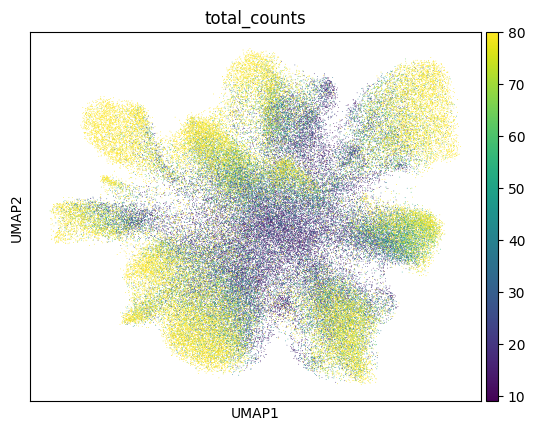

In [11]:
ddata = adata.copy()
ddata = reduce_dimensionality(ddata,method='pca',prefilter=False)
sc.pl.umap(ddata,color='total_counts',vmax=80)
#7 minutes with scanpy. 2 minutes with pegasus.

Doing dimensionality reduction...
Calculating neighborhood graph...
2023-06-06 10:58:38,549 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 37.06s.
2023-06-06 10:58:49,372 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 10.82s.
UMAP embedding...
2023-06-06 10:58:49,374 - pegasus.tools.nearest_neighbors - INFO - Found cached kNN results, no calculation is required.
2023-06-06 10:58:49,375 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 0.00s.
UMAP(min_dist=0.5, precomputed_knn=(array([[    0, 1781, 40256, ..., 14718, 82415, 37899],
       [    1, 11197, 56248, ..., 59293, 59300, 11104],
       [    2, 89204, 61636, ..., 19878, 66241, 1537],
       ...,
       [93141, 79808, 79184, ..., 84571, 80000, 36067],
       [93142, 25156, 63404, ..., 44809, 90213, 66011],
       [93143, 51354, 22957, ..., 59590, 559, 1049]]), array([[ 0.        , 0.3415018 , 0.37425613, ..., 1.3364555 ,
   

Epochs completed: 100%| ████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ 200/200 [02:18]

Tue Jun  6 11:01:26 2023 Finished embedding
2023-06-06 11:01:26,468 - pegasus.tools.visualization - INFO - Function 'umap' finished in 157.09s.


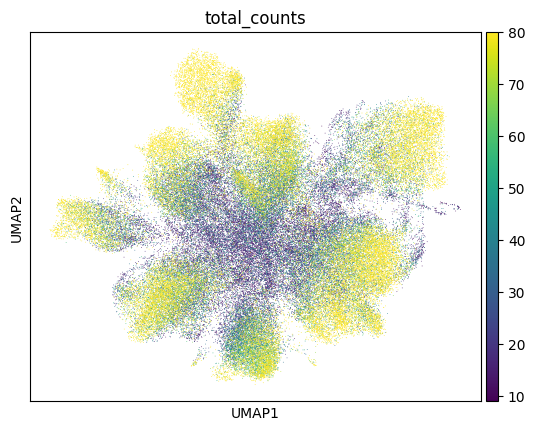

In [15]:
ddata = adata.copy()
ddata = reduce_dimensionality(ddata,method='pca',prefilter=False)
sc.pl.umap(ddata,color='total_counts',vmax=80)
#7 minutes with scanpy. 2 minutes with pegasus.

In [19]:
#These are from the 06/06/23 version of preprocessing (MAD filtering to threshold low counts.)
#ddata.write_h5ad('/gne/data/t3imagedata/conrad_store/HuLung_prefiltered_scanpy.h5ad')
ddata.write_h5ad('/gne/data/t3imagedata/conrad_store/HuLung_prefiltered_pegasus.h5ad')

#These were constructed using scanpy's neighbors + UMAP, with no MAD filtering on total counts or genes per count
#z.write_h5ad('/gne/data/t3imagedata/conrad_store/HuLung_clustered_v2.h5ad')
#pz.write_h5ad('/gne/data/t3imagedata/conrad_store/HuLung_clustered_v2_prefilter.h5ad')

# Clustering
This is a pretty straightforward module (as there is really only one way to do this.). We optimize graph modularity w.r.t cell cluster labels, using either the Louvain or Leiden method.

In [78]:
def cluster(adata, spatial_weight = 0.0, resolution=1.0, method='leiden'):
    #Args:
    #adata: The anndata after preprocessing and dimensionality reduction.
    #spatial_weight: Weight of spatial edges compared to genetic edges
    #resolution: The resolution of the modularity cost function. Lower is less clusters, higher is more clusters.
    #method: The method by which we cluster data. Louvain, Leiden, TODO:: spectral Louvain, spectral Leiden
    
    #Clustering
    adjacency = adata.obsp['connectivities']

    #Force spatial neighbors to be close.
    if spatial_weight > 0:
        sq.gr.spatial_neighbors(adata)
        adjacency += adata.obsp['spatial_connectivities']*spatial_weight
    
    #Scanpy
    if method == 'leiden':
        sc.tl.leiden(adata, resolution=resolution, adjacency=adjacency)
    elif method == 'louvain':
        sc.tl.louvain(adata, resolution=resolution, adjacency=adjacency)

    return adata

In [ ]:
#5 minutes
cdata = sc.read_h5ad('/gne/data/t3imagedata/conrad_store/HuLung_prefiltered_pegasus.h5ad')
cluster(cdata,method='leiden',resolution=1.3,spatial_weight=0.0)
cdata.write_h5ad('/gne/data/t3imagedata/conrad_store/HuLung_prefiltered_pegasus_clustered.h5ad')

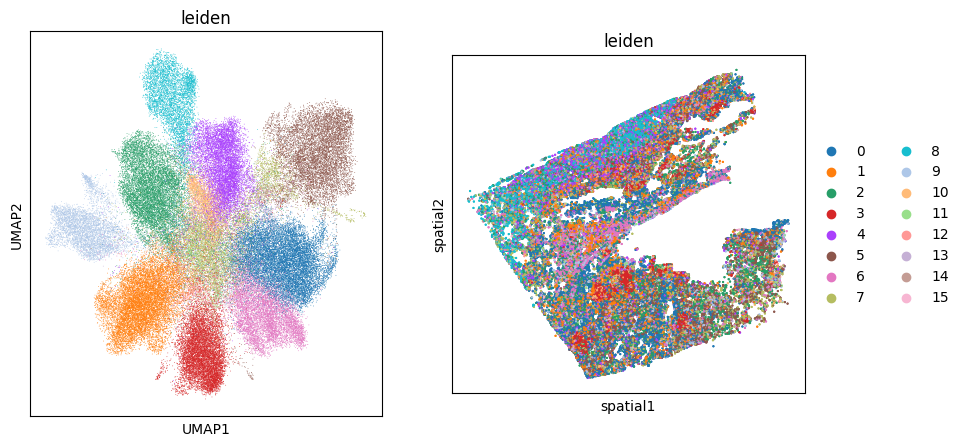

In [31]:
plot_joint_spatial_umap(cdata,cvar='leiden')

# Differentially expressed genes
There are a multitude of ways to do this. We support basic scanpy and pegasus functions, scVI functions. For more powerful/downstream analyses, diffxpy should be used (but this will be project dependent.)
TODO: add support for spatially variable genes. (SpatialDE)

In [22]:
import diffxpy.api as de
import NaiveDE
import SpatialDE

In [23]:
#Helper class that lets us convert between Pegasus and scanPy
class DEResult:
    def __init__(self,cdata,r_arr,mode='pegasus'):
        self.mode = mode

        if mode == 'pegasus':
            clusters = set(x.split(':')[0] for x in r_arr.dtype.names)

            self.cluster_dfs = {}
            for clust_id in clusters:
                pg_df = pd.DataFrame(index=cdata.var_names,columns=['pval','qval','log2fc','mean'])
                pg_df.loc[:,'mean'] = 2**(r_arr[clust_id + ':log2Mean'])
                pg_df.loc[:,'pval'] = r_arr[clust_id + ':mwu_pval']
                pg_df.loc[:,'qval'] = r_arr[clust_id + ':mwu_qval']
                pg_df.loc[:,'log2fc'] = r_arr[clust_id + ':log2FC']

                self.cluster_dfs[clust_id] = pg_df
        else:
            clusters = set(r_arr['names'].dtype.names)

            self.cluster_dfs = {}
            for clust_id in clusters:
                sc_df = pd.DataFrame(index=r_arr['names'][clust_id],columns=['pval','qval','log2fc','mean'])
                sc_df.loc[:,'log2fc'] = r_arr['logfoldchanges'][clust_id]
                sc_df.loc[:,'pval'] = r_arr['pvals'][clust_id]
                sc_df.loc[:,'qval'] = r_arr['pvals_adj'][clust_id]
                if np.count_nonzero(cdata.obs.leiden == clust_id):
                    sc_df.loc[:,'mean'] = cdata[cdata.obs.leiden == clust_id,sc_df.index].X.mean(axis=0)
                else:
                    sc_df.loc[:,'mean'] = 0

                self.cluster_dfs[clust_id] = sc_df
    
    def convert_to_pegasus(self):
        pfields = ['auroc','log2FC','log2Mean','log2Mean_other','mwu_U','mwu_pval','mwu_qval','percentage','percentage_fold_change','percentage_other']
        dfields = ['pval','log2fc','mean','mean','pval','pval','qval','pval','log2fc','log2fc']

        x = next(iter(self.cluster_dfs))
        test_res = np.recarray(
            (self.cluster_dfs[x].shape[0],),
            dtype=((np.record,[(':'.join([x,y]),'<f4') for x in self.cluster_dfs for y in pfields]))
        )
        for x in self.cluster_dfs:
            for y,c in zip(pfields,dfields):
                test_res[':'.join([x,y])] = self.cluster_dfs[x].loc[:,c]
        return test_res
    
    def convert_to_scanpy(self):
        rgg = {}
        
        x = next(iter(self.cluster_dfs))
        rgg['names'] = np.recarray(
            (self.cluster_dfs[x].shape[0],),
            dtype=((np.record,[(x, 'O') for x in self.cluster_dfs]))
        )
        rgg['pvals'] = np.recarray(
            (self.cluster_dfs[x].shape[0],),
            dtype=[(x, 'O') for x in self.cluster_dfs]
        )
        rgg['pvals_adj'] = np.recarray(
            (self.cluster_dfs[x].shape[0],),
            dtype=[(x, 'O') for x in self.cluster_dfs]
        )
        rgg['logfoldchanges'] = np.recarray(
            (self.cluster_dfs[x].shape[0],),
            dtype=[(x, 'O') for x in self.cluster_dfs]
        )
        rgg['scores'] = np.recarray(
            (self.cluster_dfs[x].shape[0],),
            dtype=[(x, 'O') for x in self.cluster_dfs]
        )

        for x in self.cluster_dfs:
            cdf = self.cluster_dfs[x]
            cdf = cdf.sort_values(by=['pval','log2fc'],ascending=[True,False])

            rgg['names'][x] = np.array(cdf.index)
            rgg['pvals'][x] = np.array(cdf.pval)
            rgg['pvals_adj'][x] = np.array(cdf.qval)
            rgg['logfoldchanges'][x] = np.array(cdf.log2fc)
            rgg['scores'][x] = np.zeros((self.cluster_dfs[x].shape[0],))
        
        return rgg

In [236]:
def differential_expression(adata, cluster_key='leiden', method='wilcoxon'):
    #Args:
    #adata: the data
    #cluster_key: adata.obs[key] determines cell cluster membership
    #method: Significance test - currently support basic DEG from scanpy, pegasus and built-in scVI method.

    if method == 'scvi':
        if 'X_scvi' not in adata.obsm:
            print('Cannot run scVI method without first training model.')
            return adata
    elif method == 'pegasus':
        pdat = UnimodalData(adata)
        pg.de_analysis(pdat, cluster=cluster_key)

        #Convert from pegasus format to scanpy format and store.
        de_res = DEResult(adata, pdat.varm['de_res'],mode='pegasus')
        adata.varm['de_res'] = de_res.convert_to_pegasus()
        adata.uns['de_res'] = de_res.convert_to_scanpy()
        
    #ADD layer here for logarithmized, but not scaled counts.
    else:
        sc.tl.rank_genes_groups(adata,use_raw=False,groupby=cluster_key,method=method,key_added='de_res')
        de_res = DEResult(adata, adata.uns['de_res'],mode='scanpy')
        adata.varm['de_res'] = de_res.convert_to_pegasus()

    return adata

In [10]:
cdata = sc.read_h5ad(s_path + 'HuLung_prefiltered_pegasus_clustered_typed.h5ad')
cdata.uns['log1p']['base'] = np.e

In [154]:
os.chdir(s_path)

In [27]:
n = cdata.obs.cell_type.value_counts()

In [35]:
cdata.obs['cell_counts'] = [x + ': ' + str(n[x]) for x in cdata.obs.cell_type]

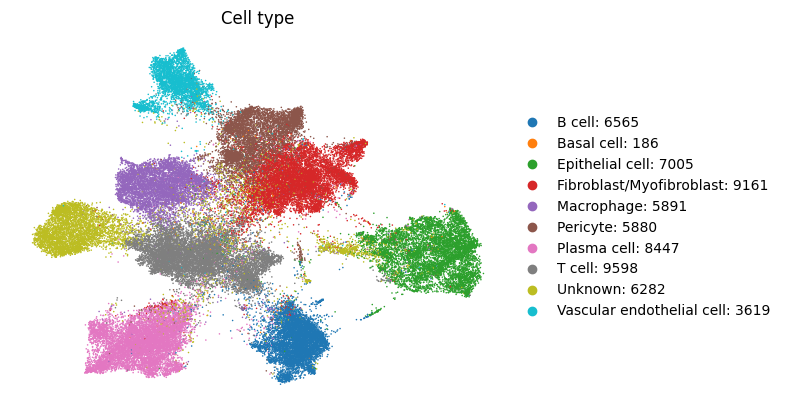

In [36]:
sc.pl.umap(cdata, color='cell_counts', frameon=False, title='Cell type', size=5, save='figA2.svg')

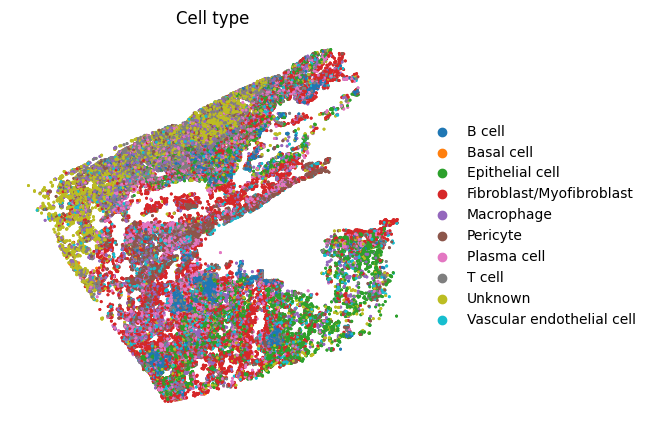

In [24]:
sq.pl.spatial_scatter(cdata, color='cell_type', frameon=False, title='Cell type', size=5, save='figB.svg',shape=None)

In [10]:
cdata = differential_expression(cdata,method='wilcoxon')

In [15]:
zdata = cdata.raw.to_adata().copy()

zdata.obs['condition'] = zdata.obs.leiden == '0'
test_res = de.test.wald(
    zdata,
    factor_loc_totest='condition',
    formula_loc='~ 1 + condition',
    noise_model='nb'
)

import gc; del zdata; gc.collect()

training location model: False
training scale model: True
iter   0: ll=10647227.853053
iter   1: ll=10647227.853053, converged: 0.00% (loc: 100.00%, scale update: False), in 0.00sec
iter   2: ll=10588033.377668, converged: 0.21% (loc: 0.21%, scale update: True), in 109.03sec
iter   3: ll=10588033.377668, converged: 0.21% (loc: 100.00%, scale update: False), in 0.00sec
iter   4: ll=10588023.820746, converged: 99.79% (loc: 99.79%, scale update: True), in 107.04sec
iter   5: ll=10588023.820746, converged: 99.79% (loc: 100.00%, scale update: False), in 0.00sec
iter   6: ll=10588010.984227, converged: 99.79% (loc: 99.79%, scale update: True), in 1.50sec
iter   7: ll=10588010.984227, converged: 99.79% (loc: 100.00%, scale update: False), in 0.00sec
iter   8: ll=10587970.972796, converged: 99.79% (loc: 99.79%, scale update: True), in 1.07sec
iter   9: ll=10587970.972796, converged: 99.79% (loc: 100.00%, scale update: False), in 0.00sec
iter  10: ll=10587970.972796, converged: 100.00% (loc: 10

128649

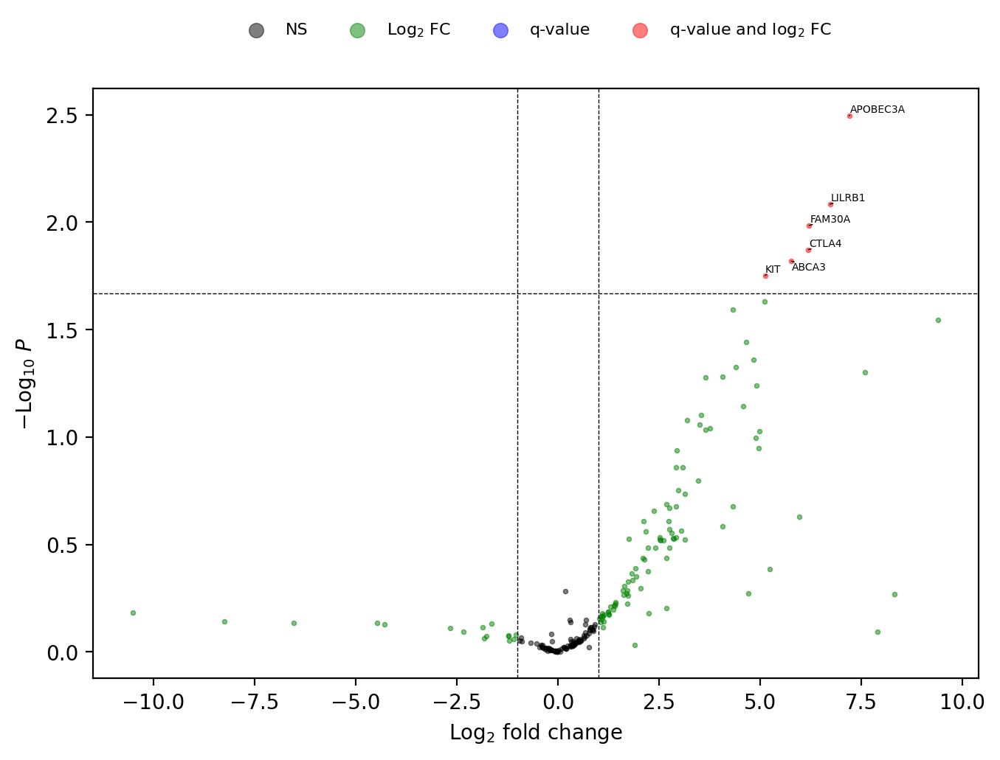

In [44]:
pg.volcano(cdata, cluster_id = '3', dpi=200)

categories: 0, 1, 2, etc.
var_group_labels: 8


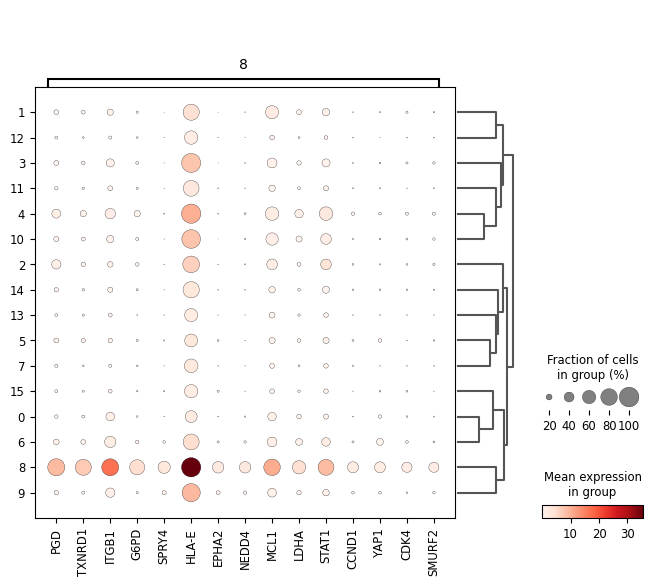

In [45]:
sc.pl.rank_genes_groups_dotplot(cdata,key='de_res',groupby='leiden',n_genes=15,groups=['8'])

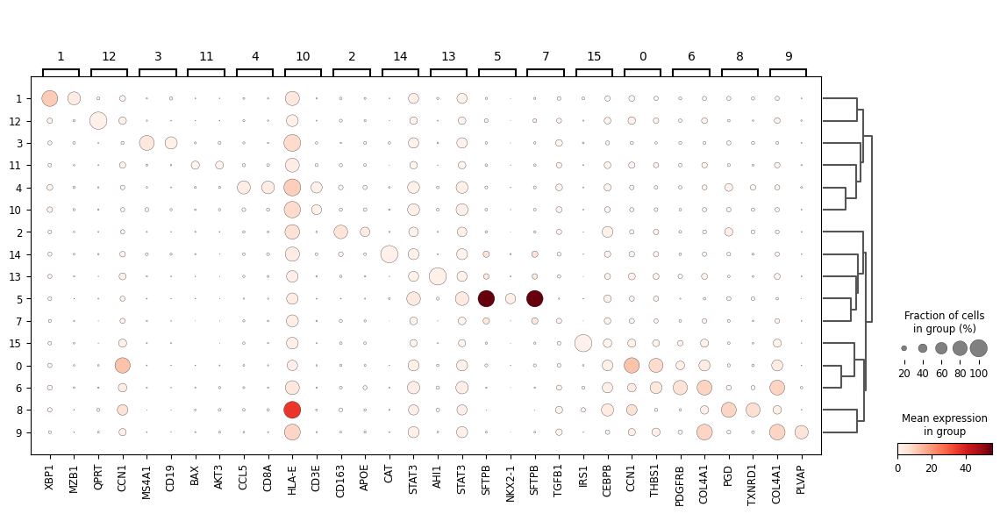

In [47]:
sc.pl.rank_genes_groups_dotplot(cdata,key='de_res',groupby='leiden',n_genes=2)

In [12]:
#Note that running the full dataset through spatialde uses a lot of memory due to the
#Ncells x Ncells covariance matrix.
spatial_coords = pd.DataFrame(index=cdata.obs_names[::1000],columns=['x','y'])
spatial_coords.loc[:,'x'] = cdata.obsm['spatial'][::1000,0]
spatial_coords.loc[:,'y'] = cdata.obsm['spatial'][::1000,1]

res = SpatialDE.run(spatial_coords, cdata[::1000,:].to_df())

Models: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:25<00:00,  2.50s/it]


In [16]:
res.loc[:,['g','l','qval']].head()

,g,l,qval
0,TAGLN,0.000061,0.005614
1,VEGFA,0.000061,0.005614
2,ADM,0.000061,0.005614
3,CDKN2A,0.000061,0.005614
4,PLAU,0.000061,0.006452


In [23]:
res.loc[(res.l > 100) & (res.qval < 0.05),['g','qval']]

,g,qval
637,JUNB,1.756912e-02
639,CDKN1A,5.613893e-03
642,ITGB1,2.657974e-02
643,THY1,5.613893e-03
645,GJB5,5.613893e-03
...,...,...
713,NCR2,5.613893e-03
714,AGER,5.613893e-03
716,EPCAM,8.447788e-12
720,STAT1,5.613893e-03


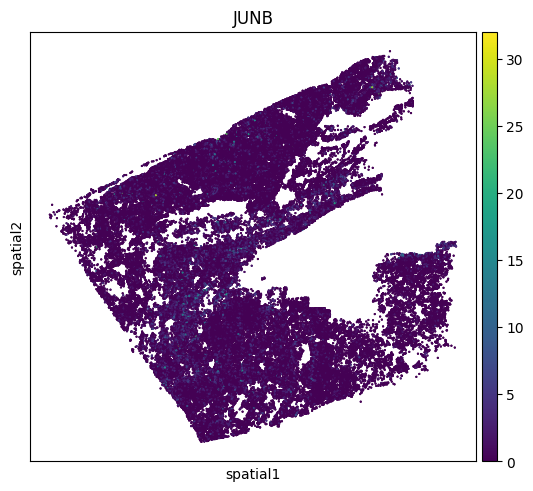

In [24]:
sq.pl.spatial_scatter(cdata,color='JUNB',shape=None)

# Cluster annotation - cell typing and pathway analysis
This function takes a cluster of cells and sets of marker genes/gene weights and calculates how well each cluster matches with each set. These sets can be cell types, pathways, etc. Also supports label transfer.

TODO: Support deconvolution of gene expression profiles (neg. binom. or otherwise). A standard library of pathways (PROGENy) and cell types (Panglao???) that can be used.

In [4]:
import decoupler as dc

In [15]:
def annotate_clusters(adata, marker_db, cluster_key='leiden', method='pegasus'):
    #Args:
    #adata: the data
    #cluster_key: which key in adata.obs tells you the cluster a cell belongs to
    #marker_db: Either a string for pegasus, or a DataFrame that labels source ('gene') to target ('cell-type').
    #method: Pegasus will use DEGs; scanpy data will use decouplr

    if method == 'pegasus':
        pdat = UnimodalData(adata)
        ctypes = pg.infer_cell_types(pdat,markers=marker_db)

        adata.obs['cell_type'] = 'Unknown'
        for cluster in ctypes:
            if len(ctypes[cluster]) == 0:
                continue
            adata.obs.loc[adata.obs[cluster_key] == cluster,'cell_type'] = ctypes[cluster][0].name
        adata.uns['cell_typing'] = ctypes
        
    return adata

## Cell typing

In [16]:
cdata = annotate_clusters(cdata,marker_db='human_lung,human_immune')

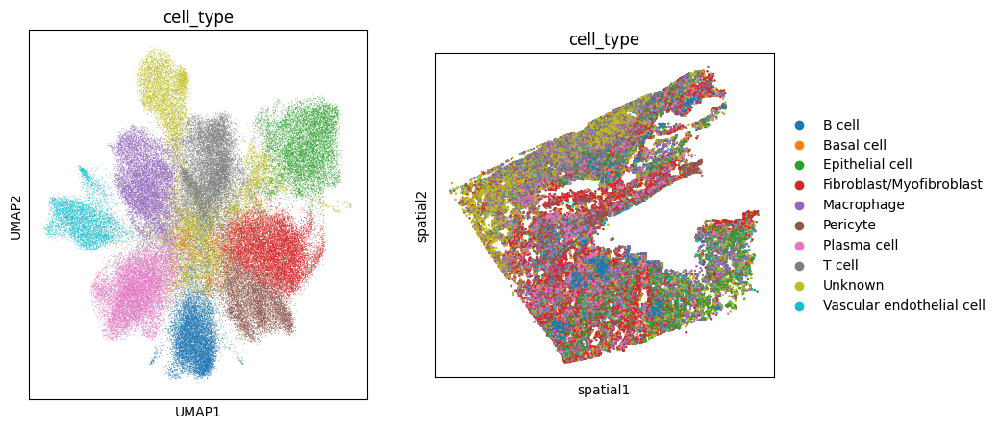

In [81]:
plot_joint_spatial_umap(cdata,cvar='cell_type')

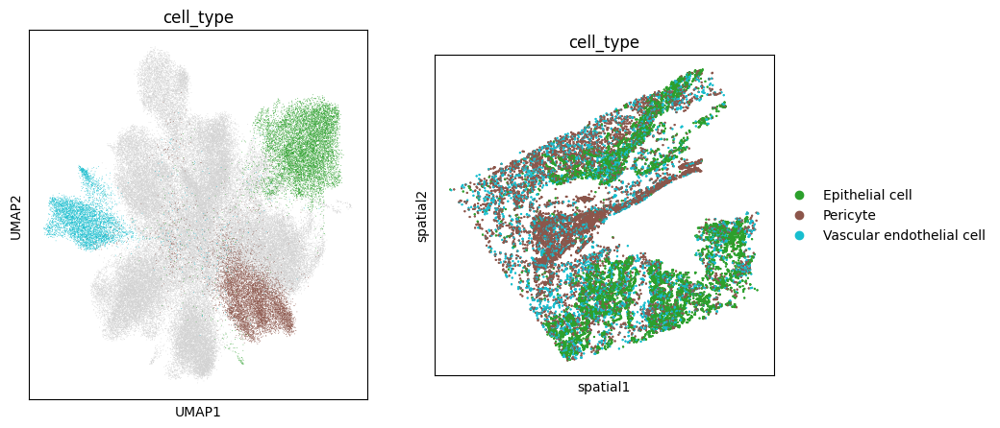

In [32]:
plot_joint_spatial_umap(cdata,cvar='cell_type',groups=['Epithelial cell','Pericyte','Vascular endothelial cell'])

In [17]:
ddata = cdata[cdata.obs.total_counts > 30,:].copy()
ddata = reduce_dimensionality(ddata,mdist=0.25)

Doing dimensionality reduction...
Calculating neighborhood graph...
2023-06-16 09:29:06,494 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 15.86s.
2023-06-16 09:29:12,137 - pegasus.tools.nearest_neighbors - INFO - Function 'calculate_affinity_matrix' finished in 5.64s.
UMAP embedding...
2023-06-16 09:29:12,138 - pegasus.tools.nearest_neighbors - INFO - Found cached kNN results, no calculation is required.
2023-06-16 09:29:12,139 - pegasus.tools.nearest_neighbors - INFO - Function 'get_neighbors' finished in 0.00s.
UMAP(min_dist=0.25, precomputed_knn=(array([[    0, 8443, 59999, ..., 54542, 47088, 61665],
       [    1, 20727, 43818, ..., 24967, 8569, 37515],
       [    2, 986, 168, ..., 7209, 6866, 47127],
       ...,
       [62631, 62022, 21960, ..., 13542, 56023, 56190],
       [62632, 25649, 30893, ..., 30508, 30585, 2692],
       [62633, 1693, 19331, ..., 16572, 40426, 47665]]), array([[ 0.        , 10.196993  , 10.644801  , ..., 11.033926  ,
     

Epochs completed:  66%| ████████████████████████████████████████████████████████████████████████████████▌                                           131/200 [01:24]

calc_mwu finished for genes in [72, 90).


Epochs completed:  69%| ████████████████████████████████████████████████████████████████████████████████████▊                                       138/200 [01:28]

calc_mwu finished for genes in [90, 108).


Epochs completed:  70%| ██████████████████████████████████████████████████████████████████████████████████████                                      140/200 [01:29]

calc_mwu finished for genes in [36, 54).


Epochs completed:  72%| ███████████████████████████████████████████████████████████████████████████████████████▉                                    143/200 [01:31]

calc_mwu finished for genes in [144, 161).


Epochs completed:  72%| ████████████████████████████████████████████████████████████████████████████████████████▌                                   144/200 [01:32]

calc_mwu finished for genes in [108, 126).


Epochs completed:  72%| █████████████████████████████████████████████████████████████████████████████████████████▏                                  145/200 [01:33]

calc_mwu finished for genes in [0, 18).


Epochs completed:  74%| ███████████████████████████████████████████████████████████████████████████████████████████▋                                149/200 [01:35]

calc_mwu finished for genes in [18, 36).


Epochs completed:  76%| █████████████████████████████████████████████████████████████████████████████████████████████▍                              152/200 [01:38]

calc_mwu finished for genes in [126, 144).


Epochs completed:  77%| ██████████████████████████████████████████████████████████████████████████████████████████████▋                             154/200 [01:39]

calc_mwu finished for genes in [54, 72).


Epochs completed: 100%| ███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████ 200/200 [02:10]

Fri Jun 16 09:31:30 2023 Finished embedding
2023-06-16 09:31:30,801 - pegasus.tools.visualization - INFO - Function 'umap' finished in 138.66s.


In [69]:
for cid in ddata.uns['cell_typing']:
    ddata.uns['cell_typing'][cid] = [str(x) for x in ddata.uns['cell_typing'][cid]]
ddata.write_h5ad('/gne/data/t3imagedata/conrad_store/HuLung_prefiltered_pegasus_clustered_typed.h5ad')

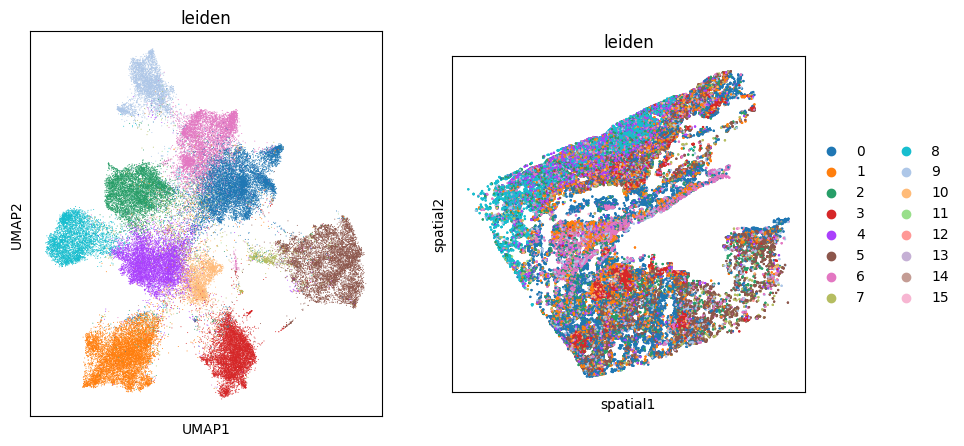

In [18]:
plot_joint_spatial_umap(ddata,cvar='leiden')

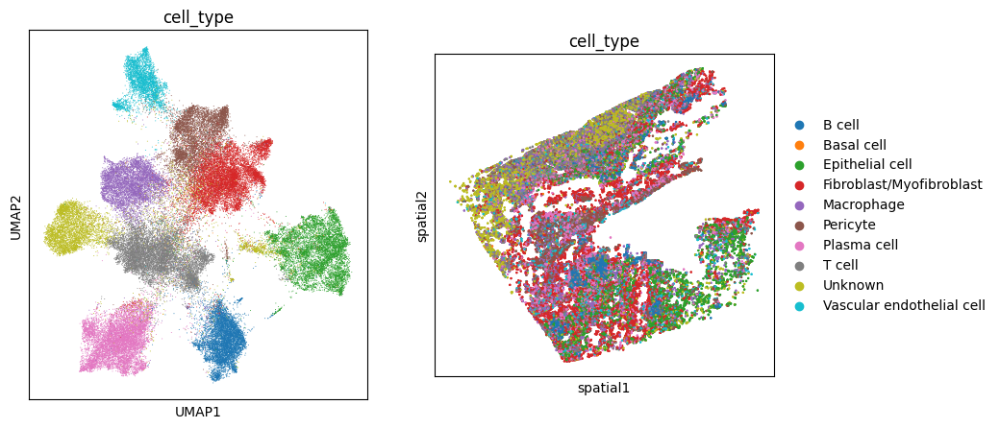

In [679]:
plot_joint_spatial_umap(ddata,cvar='cell_type')

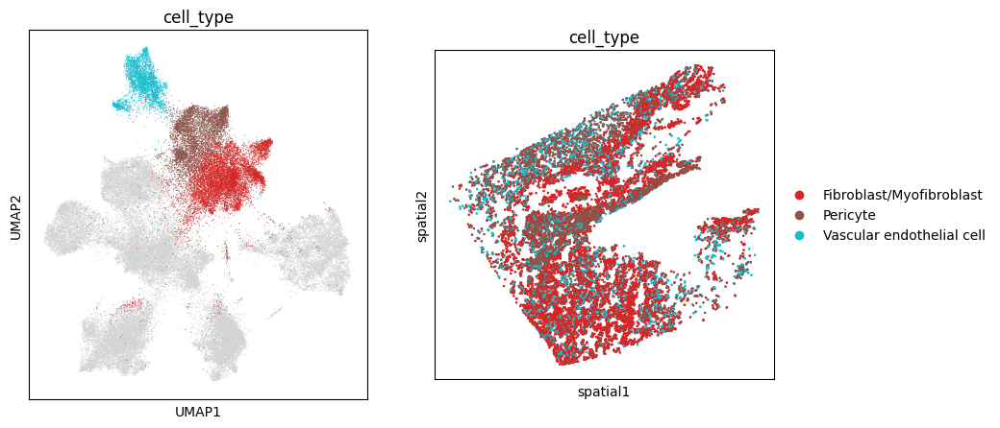

calc_mwu finished for genes in [467, 484).
calc_mwu finished for genes in [36, 54).
calc_mwu finished for genes in [382, 399).
calc_mwu finished for genes in [90, 108).
calc_mwu finished for genes in [161, 178).
calc_mwu finished for genes in [161, 178).
calc_mwu finished for genes in [314, 331).
calc_mwu finished for genes in [263, 280).
calc_mwu finished for genes in [331, 348).
calc_mwu finished for genes in [280, 297).
calc_mwu finished for genes in [229, 246).
calc_mwu finished for genes in [246, 263).
calc_mwu finished for genes in [365, 382).
calc_mwu finished for genes in [72, 90).
calc_mwu finished for genes in [416, 433).
calc_mwu finished for genes in [212, 229).
calc_mwu finished for genes in [195, 212).
calc_mwu finished for genes in [348, 365).
calc_mwu finished for genes in [297, 314).
calc_mwu finished for genes in [297, 314).
calc_mwu finished for genes in [178, 195).
calc_mwu finished for genes in [263, 280).
calc_mwu finished for genes in [212, 229).
calc_mwu finishe

In [32]:
plot_joint_spatial_umap(ddata,cvar='cell_type',groups=['Pericyte','Vascular endothelial cell','Fibroblast/Myofibroblast'])

## Pathway analysis

In [24]:
s_path = '/gne/data/t3imagedata/conrad_store/'
markers = pd.read_csv(s_path + 'progeny.csv')
dc.run_mlm(ddata,markers,source='pathway',target='genesymbol',weight='weight',min_n=3,verbose=True)

Running mlm on mat with 62634 samples and 484 targets for 14 sources.


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:01<00:00,  3.51it/s]


In [29]:
#Load activities (in each geneset) as a separate anndata
acts = dc.get_acts(ddata,obsm_key='mlm_estimate')
mean_acts = dc.summarize_acts(acts, groupby='cell_type', min_std=0)

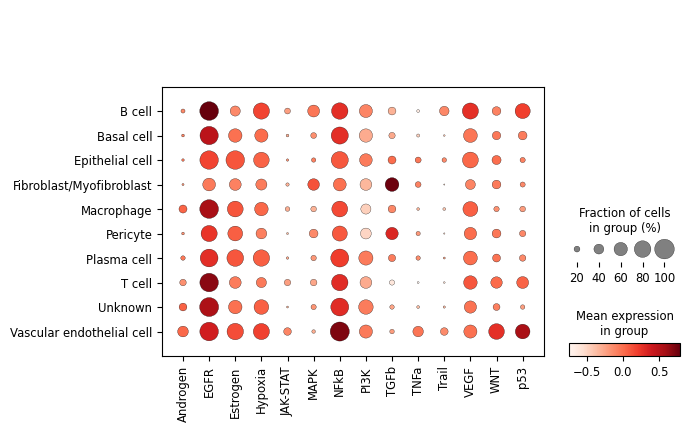

In [30]:
sc.pl.dotplot(acts,var_names = acts.var_names,groupby='cell_type')

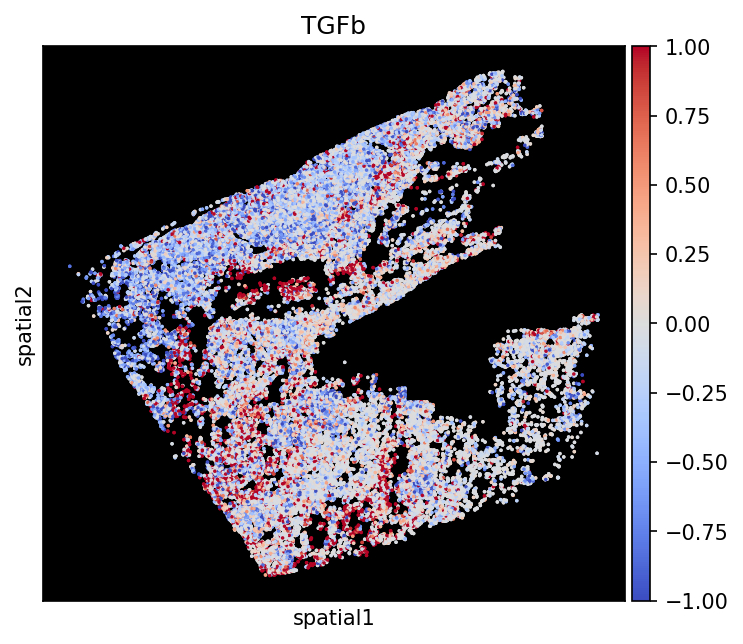

In [45]:
f = plt.figure(dpi=150)
a = plt.gca()
sq.pl.spatial_scatter(acts,color='TGFb',shape=None,vmax=1,vmin=-1,cmap='coolwarm',ax=a)
a.patch.set_facecolor('black')
plt.show()

# Spatially neighborhood/niche analysis
Let's look at spatial neighbor graphs. We can cluster these graphs in the same way as the genetic graphs. I suspect we can simply convert this into Phenograph/CLQ format.

In [37]:
#Brainstorm
#GVAE variance network - high variance implies multiple connecivity patterns
#Niche 'neighborhood' content - factor the niche members into types
#Niche-niche interaction/neighborhood enrichment
#Niche-niche CLQ

#SpatialDE
#Trendceek

ddata = sc.read_h5ad(s_path + 'HuLung_prefiltered_pegasus_clustered_typed.h5ad')

In [8]:
import os
import glob
import numpy as np
import pandas as pd

import anndata as ad
from anndata import AnnData
import scanpy as sc

from sklearn.neighbors import KDTree
from multiprocessing import Pool

## Initial CLQ implementation from Raj

In [12]:
def initializer_pool(argTree, argobs_df,argcluster_uniq):
    global tree
    global obs_df
    global cluster_uniq
    
    tree = argTree
    obs_df = argobs_df
    cluster_uniq = argcluster_uniq
    
def neighborhood_analysis(point):
    global tree
    global obs_df
    global cluster_uniq
    
    pt = np.reshape(point, (-1, 2))
    ndx = tree.query_radius(pt, r=50)

    neighborhood = [obs_df[i] for i in ndx[0].tolist()]
    cluster_count=[]
    for cluster in cluster_uniq:
        cluster_count.append(neighborhood.count(cluster))

    return cluster_count

def adjaceny_count(points,tree,obs_df,cluster_uniq):
    p = Pool(initializer=initializer_pool, initargs=[tree, obs_df,cluster_uniq])
    temp = p.map(neighborhood_analysis, [i for i in points], chunksize=10)

    p.close()
    p.join()

    count_df = pd.DataFrame(temp,columns = ['nhood_count '+x for x in cluster_uniq])
    
    return count_df

def calc_clqs(count_df,global_freq_df,cluster_uniq,obs_df,cluster_obs):
    freq_df= count_df.div(count_df.sum(axis=1), axis=0)
    local_clq=freq_df.div(global_freq_df.iloc[0], axis='columns')  # Divide local (neighborhood) frequency by global frequency to get the local CLQ
    
    local_clq[cluster_obs]=obs_df

    # Get mean of each cluster's local CLQ to generate the global CLQ
    global_clq = pd.DataFrame(columns = cluster_uniq)

    for cl_unq in cluster_uniq:

        temp=local_clq[local_clq[cluster_obs]==cl_unq]

        if len(temp)>0:
            temp=temp.mean()
            global_clq.loc[cl_unq,:] = temp.values.tolist()
        else:
            global_clq.loc[cl_unq,:] = np.nan
    
    return local_clq,global_clq

def CLQ(adata,cluster_uniq,cluster_obs='cluster_id', radius=50, num_permute=1000):
    
    """Calculates local and global CLQ for a given image stored in anndata object
    
    Parameters
    ----------
    adata : Anndata object. Anndata object must contain 2D numpy adata['spatial'].obsm which contains [x,y] coordinate. 
            Also, an obs column with cluster ID/name
    cluster_uniq: A list of all unique cluster names (get from study level data). We do this as a parameter since some images may not contain a given cluster. 
    cluster_obs: string name of cluster column
    radius: neighborhood size in pixels
    num_permute: number of permutations for CLQ null hypothesis test
 
    Returns
    -------
    adata : Anndata object with appended neighborhood counts and local CLQ values as per cluster ID/name obs. And global CLQ and permutation score matrices in uns. 
    
    """
    obs_df=adata.obs[cluster_obs]
    obs_df=[str(x) for x in obs_df]
    
    global_cluster_count=[]       # Get global (per image) counts of each cluster
    for cluster in cluster_uniq:
        global_cluster_count.append(obs_df.count(cluster))

    total_count=sum(global_cluster_count)   # Get global frequency for each cluster
    global_cluster_freq=[x/total_count for x in global_cluster_count]
    global_freq_df = pd.DataFrame([global_cluster_freq],columns = ['nhood_count '+x for x in cluster_uniq])

    points=adata.obsm['spatial'].tolist()   # Create KDTree
    tree=KDTree(points)
    
    count_df=adjaceny_count(points,tree,obs_df,cluster_uniq)
    
    local_clq,global_clq=calc_clqs(count_df,global_freq_df,cluster_uniq,obs_df,cluster_obs)
    #global_clq['']
    
    #permute
    permute_test=global_clq*0

    for z in range(num_permute):
        obs_df_permute=adata.obs[cluster_obs].sample(frac=1).reset_index(drop=True) # randomly permute dataframe
        obs_df_permute=[str(x) for x in obs_df_permute]
        
        count_df_permute=adjaceny_count(points,tree,obs_df_permute,cluster_uniq)
        
        local_clq_permute,global_clq_permute=calc_clqs(count_df_permute,global_freq_df,cluster_uniq,obs_df_permute,cluster_obs)
        
        global_clq_permute = pd.DataFrame(columns = cluster_uniq)
        for cl_unq in cluster_uniq:

            temp=local_clq_permute[local_clq_permute[cluster_obs]==cl_unq]

            if len(temp)>0:
                temp=temp.mean()
                global_clq_permute.loc[cl_unq,:] = temp.values.tolist()
            else:
                global_clq_permute.loc[cl_unq,:] = np.nan

            

        permute_test=permute_test+(global_clq>global_clq_permute)*1

    permute_test=(permute_test/num_permute)
    
    local_clq=local_clq.iloc[:,:-1]
    new_names=['localCLQ to '+x.split('nhood_count ')[1] for x in local_clq.columns.tolist()]
    local_clq.columns=new_names

    global_clq.index = global_clq.columns.tolist()
    permute_test.index = permute_test.columns.tolist()
    
    dfobs=adata.obs.copy()
    dfobs=dfobs.reset_index(drop=True)
    adata.obs=pd.concat([dfobs,count_df,local_clq],axis=1)
    
    adata.uns["global_clq"] = global_clq
    adata.uns["clq_permutate_test"] = permute_test
    
    return adata  

## Test new CLQ optimized

In [19]:
%%time
CLQ(ddata,list(np.unique(ddata.obs.cell_type)),cluster_obs='cell_type',radius=50,num_permute=1000)

CPU times: user 27min 19s, sys: 23min 29s, total: 50min 48s
Wall time: 1h 2min 32s


AnnData object with n_obs × n_vars = 62634 × 484
    obs: 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y', 'blank_counts', 'n_genes', 'n_genes_by_counts', 'total_counts', 'leiden', 'cell_type', 'nhood_count B cell', 'nhood_count Basal cell', 'nhood_count Epithelial cell', 'nhood_count Fibroblast/Myofibroblast', 'nhood_count Macrophage', 'nhood_count Pericyte', 'nhood_count Plasma cell', 'nhood_count T cell', 'nhood_count Unknown', 'nhood_count Vascular endothelial cell', 'localCLQ to B cell', 'localCLQ to Basal cell', 'localCLQ to Epithelial cell', 'localCLQ to Fibroblast/Myofibroblast', 'localCLQ to Macrophage', 'localCLQ to Pericyte', 'localCLQ to Plasma cell', 'localCLQ to T cell', 'localCLQ to Unknown', 'localCLQ to Vascular endothelial cell', 'nhood_count B cell', 'nhood_count Basal cell', 'nhood_count Epithelial cell', 'nhood_count Fibroblast/Myofibroblast', 'nhood_count Macrophage', 'nhood_count Pericyte', 'nhood_count Plasma cell', 'nhood_count T cell', 'nhood_count Unknown

In [29]:
ddata.uns['clq_permutate_test'].loc['Basal cell',p.loc['Basal cell',:].index]

T cell                       0.216
Fibroblast/Myofibroblast     0.484
Plasma cell                   0.01
Epithelial cell              0.009
B cell                       0.067
Unknown                      0.795
Macrophage                   0.805
Pericyte                     0.999
Vascular endothelial cell    0.864
Basal cell                   0.982
Name: Basal cell, dtype: object

In [9]:
#Utilize complex numbers to vectorize permutation counts
def unique_perms(a):
    weight = 1j*np.arange(0,a.shape[0])
    b = a + weight[:, np.newaxis]
    u, cts = np.unique(b, return_counts=True)
    return u,cts

#Mapping functions for parallelization
def process_neighborhood(n):
    global t_perms,t_clust,tcell_perms
    ncv = np.zeros((t_perms+1,t_clust),dtype=np.float32)
    
    if len(n) == 0:
        return ncv
    
    j,cts = unique_perms(tcell_perms[:,n])
    ncv[np.imag(j).astype(np.int32),np.real(j).astype(np.int32)] = cts

    return ncv

def pool_ncvs(argperm,argclust,argcperms):
    global t_perms,t_clust,tcell_perms
    t_perms,t_clust,tcell_perms = argperm,argclust,argcperms

#Optimized CLQ using vectorized operations
def CLQ_opt(adata,clust_col='leiden',clust_uniq=None,radius=50,n_perms=1000):
    #Calculate spatial neighbors once.
    sq.gr.spatial_neighbors(adata,coord_type='generic',radius=radius)
    neigh_idx = adata.obsp['spatial_connectivities'].tolil()
    neighborhoods = [x for i,x in enumerate(neigh_idx.rows)] #Append self to match previous implementation? (x + [i])
    n_cells = len(neighborhoods)

    #Global frequencies.
    global_cluster_freq = adata.obs[clust_col].value_counts(normalize=True)
    if clust_uniq is None:
        clust_uniq = global_cluster_freq.index

    #Cluster identities for each cell
    cell_ids = adata.obs.loc[:,clust_col]

    #Map clusters to integers for fast vectorization in numpy
    label_dict = {x:i for i,x in enumerate(clust_uniq)}
    n_clust = len(label_dict)

    #Permute cluster identities across cells
    cell_id_perms = [[label_dict[x] for x in cell_ids]] #0th permutation is the observed NCV
    cell_id_perms.extend([[label_dict[x] for x in np.random.permutation(cell_ids)] for i in range(n_perms)])
    cell_id_perms = np.array(cell_id_perms)

    #Calculate neighborhood content vectors (NCVs). We can parallelize here if speed is necessary as this is the computational bottleneck.
    '''
    ncv = np.zeros((n_perms+1,n_cells,n_clust),dtype=np.float32)
    for i,cell_neighborhood in enumerate(neighborhoods):
        if len(cell_neighborhood) == 0:
            continue

        j,cts = unique_perms(cell_id_perms[:,cell_neighborhood])
        ncv[np.imag(j).astype(np.int32),i,np.real(j).astype(np.int32)] = cts
    '''
    p = Pool(initializer=pool_ncvs, initargs=[n_perms, n_clust, cell_id_perms])
    temp = p.map(process_neighborhood, [n for n in neighborhoods])
    p.close()
    p.join()

    ncv = np.array(temp).transpose((1,0,2))
    ncv = ncv/ncv.sum(axis=2)[:,:,np.newaxis]
    
    #Read out local CLQ from NCV vectors
    local_clq = ncv/np.array([global_cluster_freq[x] for x in label_dict])
    
    #Average local_clq over clusters to get global CLQ
    global_clq = np.array([np.nanmean(local_clq[cell_id_perms == label_dict[x],:].reshape(n_perms+1,-1,n_clust),1) for x in label_dict])

    #Read out the observed local and global CLQs
    idx = [x for x in label_dict]
    lclq = pd.DataFrame(local_clq[0,:,:],columns=idx)
    gclq = pd.DataFrame(global_clq[:,0,:],index=idx,columns=idx)

    #Permutation test
    clq_perm = (global_clq[:,1:,:] < global_clq[:,0,:].reshape(n_clust,-1,n_clust)).sum(1)/n_perms
    clq_perm = pd.DataFrame(clq_perm,index=idx,columns=idx)
    return lclq,gclq,clq_perm

    adata.uns['global_clq'] = gclq
    adata.obsm['local_clq'] = lclq

    #Run permutation test
    adata.uns['clq_permute'] = (global_clq[:,1:,:] > global_clq[:,0,:].reshape(n_clust,-1,n_clust)).sum(1)/n_perms

    return adata

In [193]:
%%time
l,g,p = CLQ_opt(ddata,clust_col='cell_type',n_perms=1000) #5mins w/ 1 core

CPU times: user 5min 22s, sys: 12 s, total: 5min 34s
Wall time: 5min 34s


In [469]:
%%time
l,g,p = CLQ_opt(ddata,clust_col='cell_type',n_perms=1000) #1min with 14 cores

CPU times: user 38.9 s, sys: 21.1 s, total: 1min
Wall time: 1min 17s


In [43]:
%%time
l,g,p = CLQ_opt(ddata,clust_col='cell_type',n_perms=5000,radius=50*0.325) #1min with 14 cores

CPU times: user 3min 17s, sys: 1min 31s, total: 4min 48s
Wall time: 4min 48s


## Spatial pooling and hypergeometric overrepresentation test

In [7]:
#The distribution of the count occurence of cluster 2 in the neighborhood of a cell of cluster 1
#is determined by a hypergeometric distribution - M = total # cells, N = # neighboring cells, n = # cells in cluster 2
#For X cells in cluster 1 (and a large number of cells so we can ignore selection effects across X), 
#the total number of counts of cluster 2 in cluster 1 neighborhoods is given by the sum of X hypergeometric variables (N is variable as we are using radius).

#This is the Fisher exact test for over-representation of cluster 2 in the neighborhood of cluster 1 cells.
#The null hypothesis is that cluster 2 cells are in the neighborhood(s) of cluster 1 cells at the expected rate for their frequency.
def cluster_overrepresentation(ncv_dat,cluster_key='leiden'):
    clusters = ncv_dat.obs[cluster_key].value_counts()
    p_up = pd.DataFrame(index=clusters.index,columns=clusters.index)
    for cid in clusters.index:
        ncv_clust = ncv_dat[ncv_dat.obs[cluster_key] == cid]

        #Median degree in source cluster
        n_neighbors = np.round(np.median(ncv_clust.X.sum(axis=1)))

        #Total num cells
        n_cells = ncv_dat.shape[0]

        for int_id in clusters.index:
            #Number of cells in interacting/neighboring cluster.
            n_interacting = clusters[int_id]

            hdist = hypergeom(n_cells,n_interacting,n_neighbors)
            p_up.loc[cid,int_id] = 1 - hdist.cdf(np.round(np.median(ncv_clust[:,int_id].X)))
    
    return p_up

In [8]:
def adjacency_counts(adata,cluster_col='leiden',radius=50):
    sq.gr.spatial_neighbors(adata,coord_type='generic',radius=radius)    
    n_cells = adata.shape[0]

    label_dict = {x:i for i,x in enumerate(adata.obs[cluster_col].value_counts().index)}
    cell_ids = np.array([label_dict[x] for x in adata.obs[cluster_col]])
    n_clust = len(label_dict)


    neigh_idx = adata.obsp['spatial_connectivities'].tolil()
    neighborhoods = [x for i,x in enumerate(neigh_idx.rows)]

    ncv = np.zeros((n_cells,n_clust),dtype=np.float32)
    for i,cell_neighborhood in enumerate(neighborhoods):
        if len(cell_neighborhood) == 0:
            continue

        j,cts = np.unique(cell_ids[cell_neighborhood],return_counts=True)
        ncv[i,j] = cts
    
    return pd.DataFrame(ncv,index=adata.obs.index,columns=[x for x in label_dict])

## Run analysis

In [37]:
from scipy.stats import hypergeom

In [15]:
ncv = adjacency_counts(ddata, cluster_col='cell_type', radius=50)
lclq,gclq,cperm = CLQ_opt(ddata)

ncv_dat = AnnData(ncv,obs=ddata.obs)
ncv_dat.obsm['spatial'] = ddata.obsm['spatial']

In [16]:
sc.pp.neighbors(ncv_dat,n_neighbors=170)#,method='rapids') #170
sc.tl.umap(ncv_dat)#,method='rapids')

In [17]:
sc.tl.leiden(ncv_dat,resolution=0.7)

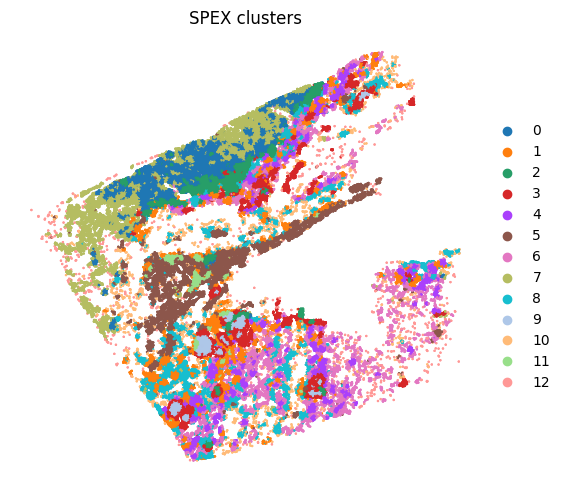

In [10]:
#ncv_dat.uns.pop('leiden_colors')
sq.pl.spatial_scatter(ncv_dat,color='leiden',shape=None,title='SPEX clusters',save='figB2',frameon=False)

In [36]:
ncv_dat.write_h5ad('/gne/data/t3imagedata/conrad_store/VS9_HuLungCa_HF-106315_VS9Library_V11_LH_06-04-2021/HuLung_NCV_clusters.h5ad')

In [9]:
ncv_dat = sc.read_h5ad('/gne/data/t3imagedata/conrad_store/VS9_HuLungCa_HF-106315_VS9Library_V11_LH_06-04-2021/HuLung_NCV_clusters.h5ad')

## Hypergeometric test

In [71]:
p_up = cluster_overrepresentation(ncv_dat,'cell_type')

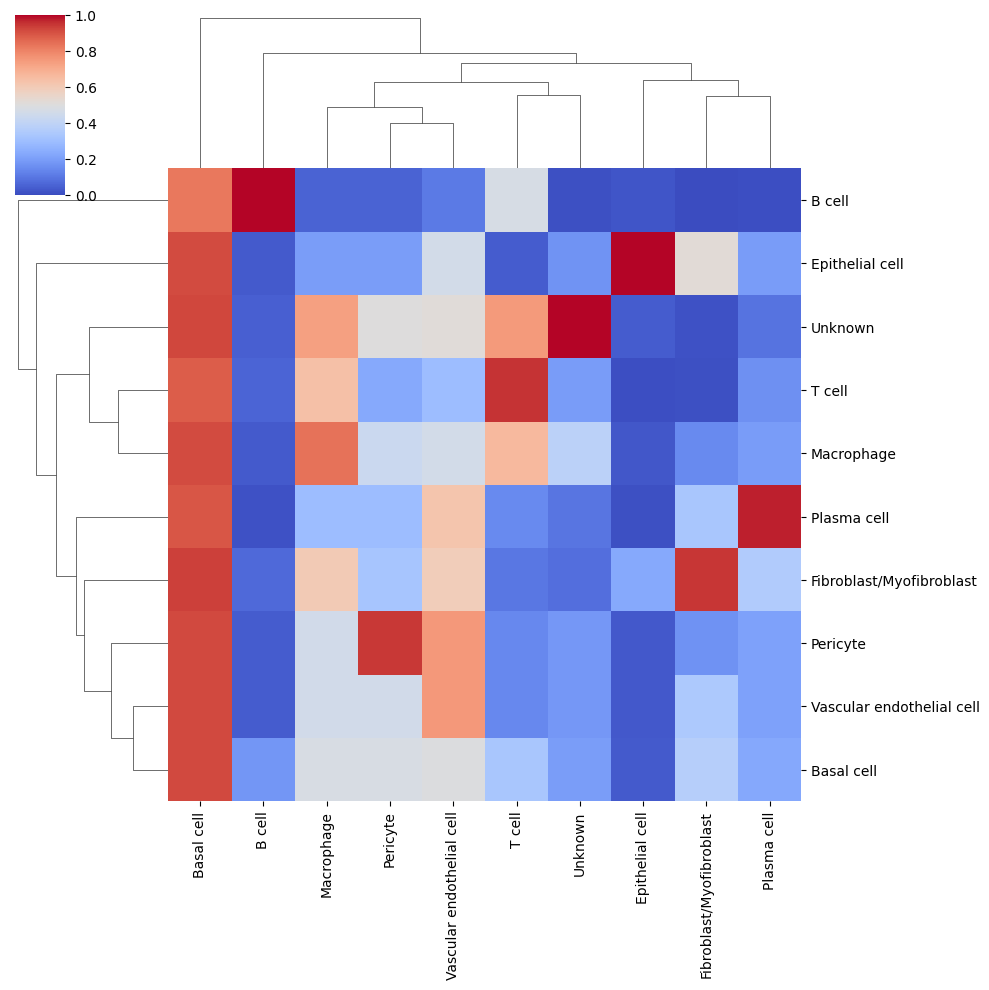

In [72]:
sns.clustermap((1-p_up).astype('float'),cmap='coolwarm',vmin=0,vmax=1)

## CLQ

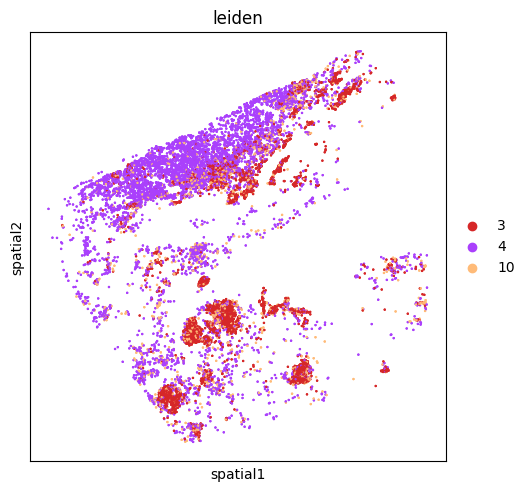

In [53]:
sq.pl.spatial_scatter(ddata,color='leiden',groups=['10','4','3'],shape=None)

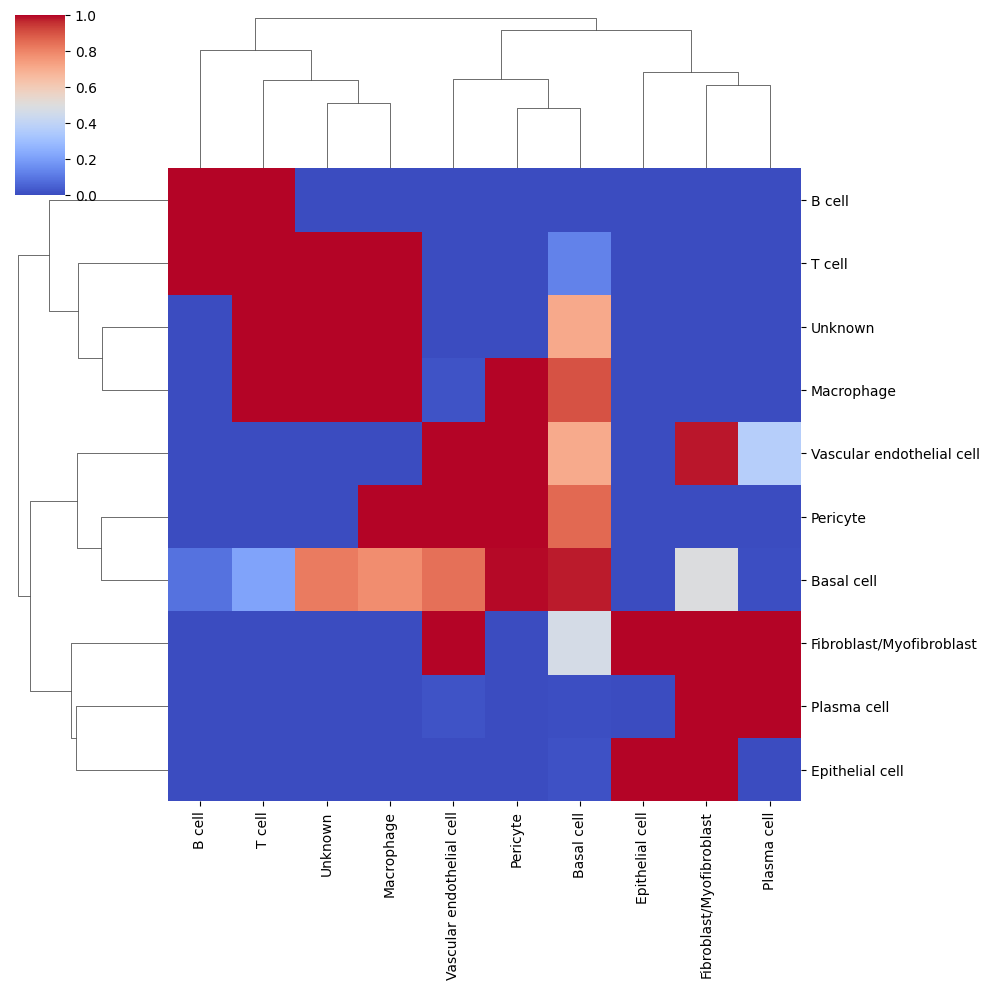

In [42]:
df = ddata.uns['global_clq']
df['index1'] = df.index

clq_melt=pd.melt(df, id_vars=['index1'], value_vars=df.columns.tolist()[:-1])

'''
g=sns.relplot(
    data=clq_melt,
    x='index1', y='variable', hue='value',
    palette="coolwarm", edgecolor=".7",hue_norm=(0, 1),
    height=5
)
'''

g = sns.clustermap(
    p.astype(np.float32),
    cmap='coolwarm',
    vmin=0,vmax=1
)

In [68]:
l,g,p = CLQ_opt(ddata)

In [64]:
clust_types = {}
for n in np.unique(ddata.obs.leiden):
    clust_types[n] = n + ': ' + np.unique(ddata[ddata.obs.leiden == n,:].obs.cell_type)[0]

In [71]:
gg = g.rename(index=clust_types,columns=clust_types)

In [65]:
pp = p.rename(index=clust_types,columns=clust_types)

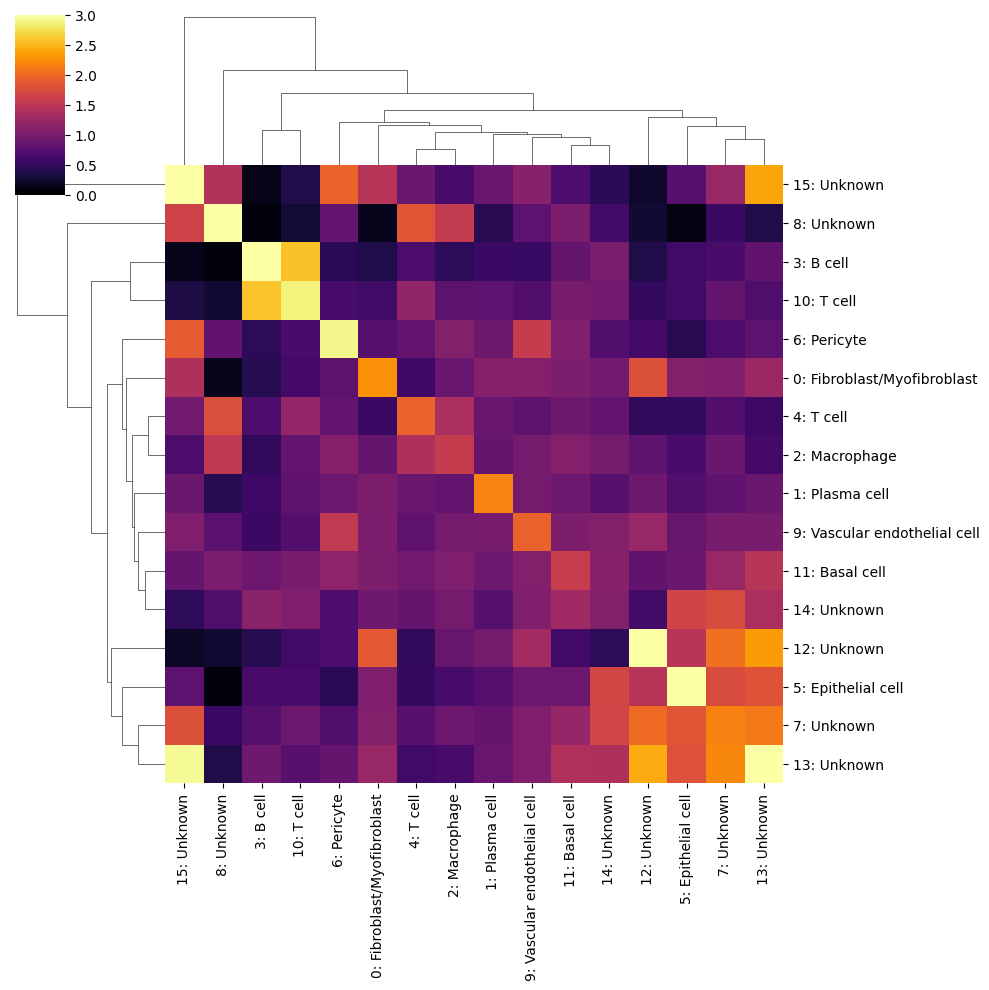

In [78]:
sns.clustermap(
    gg.astype(np.float32),
    cmap='inferno',
    vmin=0,
    vmax=3
)

In [109]:
l,g,p = CLQ_opt(ncv_dat, clust_col='leiden')

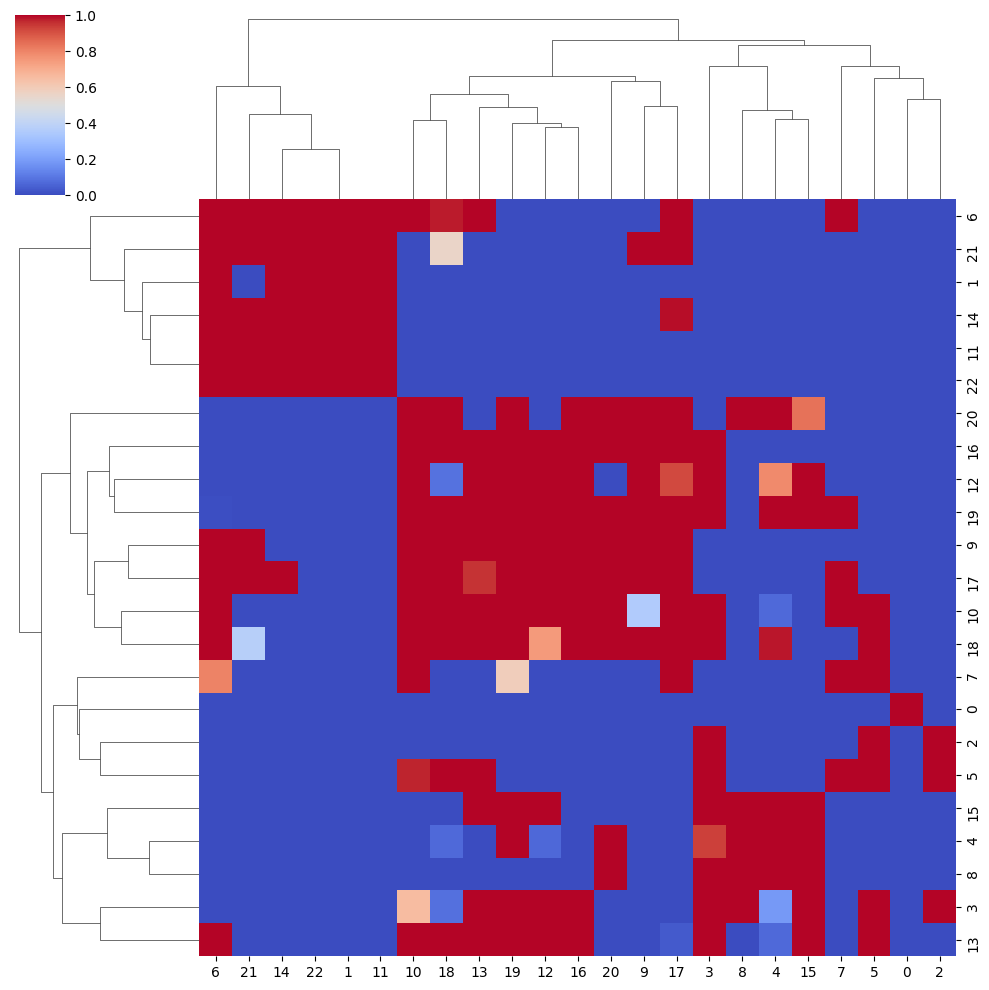

In [110]:
sns.clustermap(p,cmap='coolwarm',vmax=1,vmin=0)
plt.show()

## Cell-type composition of niches

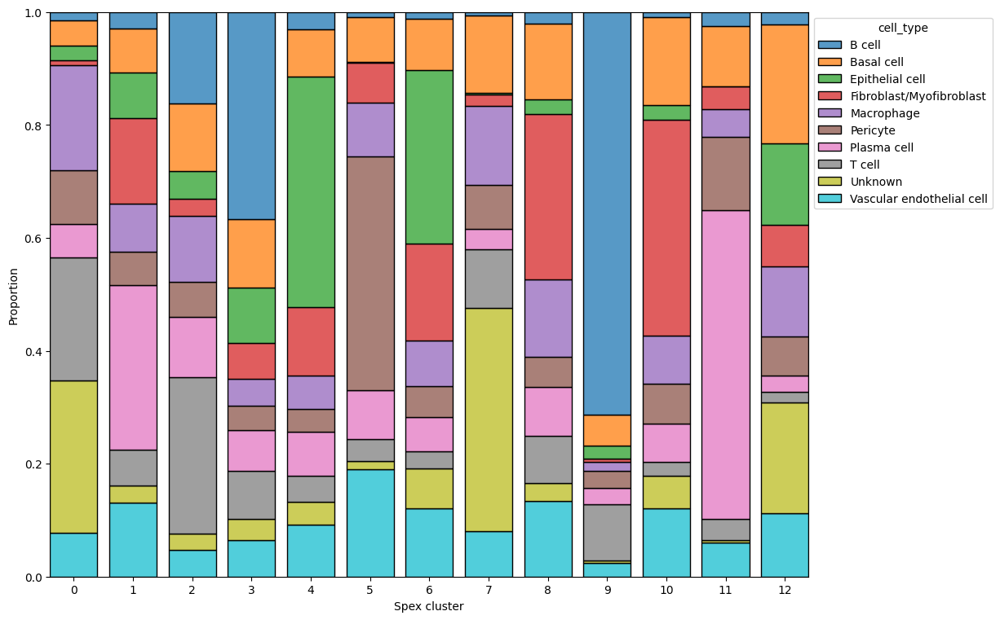

In [11]:
f,a = plt.subplots(1,1)
f.set_size_inches(12,9)

g = sns.histplot(
    data=ncv_dat.obs,
    stat='proportion',
    discrete=True,
    shrink=0.8,
    multiple='fill',
    x='leiden',
    hue='cell_type',
    common_norm=False,
    ax=a,
)

sns.move_legend(g,'upper right',bbox_to_anchor=(1.25,1.00))
plt.xlabel('Spex cluster')
plt.savefig('figures/figB3v2.svg')
plt.show()

In [39]:
#s_path = '/gne/data/t3imagedata/conrad_store/SC_Atlases/'
#markers = pd.read_csv(s_path + 'progeny.csv')

ddata.obs['niche'] = ncv_dat.obs.leiden
ddata.layers['counts'] = test_adata[ddata.obs_names,:].X
ddata.layers['norm_scale'] = ddata.X.copy()
#ddata.X = ddata.layers['norm_scale']

udata = ddata[ddata.obs.cell_type != 'Unknown',:].copy()
import decoupler as dc
dc.run_mlm(udata,markers,
            source='pathway',
            target='genesymbol',
            weight='weight',
            min_n=0,
            verbose=True,
            use_raw=False,
)

#Load activities (in each geneset) as a separate anndata
acts = dc.get_acts(udata,obsm_key='mlm_estimate')
mean_acts = dc.summarize_acts(acts, groupby='cell_type', min_std=0)

Running mlm on mat with 56352 samples and 484 targets for 14 sources.


100%|█████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:01<00:00,  4.09it/s]


In [177]:
sc.pl.umap(acts,color=['Trail','cell_type'],vmax=1,vmin=-1,cmap='coolwarm')

ValueError: Key Trail could be found in both .var_names and .obs.columns

<Figure size 1455.6x480 with 0 Axes>

In [173]:
dc.run_mlm(
    udata,markers,
    source='pathway',
    target='genesymbol',
    weight='weight',
    min_n=0,
    verbose=True,
    use_raw=False,
)

acts = dc.get_acts(udata,obsm_key='mlm_estimate')
mean_acts = dc.summarize_acts(acts, groupby='niche_by_type', min_std=0)

Running mlm on mat with 56352 samples and 484 targets for 14 sources.


100%|█████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:00<00:00,  6.05it/s]


Running mlm on mat with 55261 samples and 484 targets for 14 sources.


100%|█████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:01<00:00,  5.30it/s]


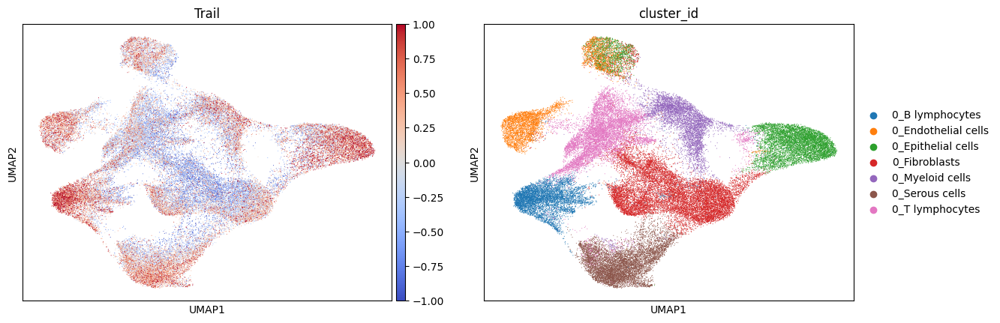

In [175]:
gdat.obs.SpexCluster = pd.Categorical(gdat.obs.SpexCluster)
dc.run_mlm(
    gdat,markers,
    source='pathway',
    target='genesymbol',
    weight='weight',
    min_n=0,
    verbose=True,
    use_raw=False
)
acts = dc.get_acts(gdat,obsm_key='mlm_estimate')
sc.pl.umap(acts,color=['Trail','cluster_id'],vmax=1,vmin=-1,cmap='coolwarm')

<AxesSubplot:>

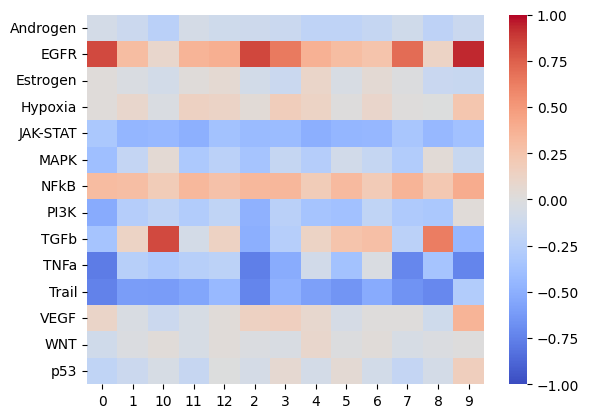

In [56]:
sns.heatmap(mean_acts.T,cmap='coolwarm',vmin=-1,vmax=1)

In [127]:
num_types = len(acts.obs.cell_type)
num_niches = len(acts.obs.niche)

macts = pd.DataFrame(columns=acts.var_names)

for c in np.unique(acts.obs.cell_type):
    cdat = acts[acts.obs.cell_type == c,:]
    for n in np.unique(acts.obs.niche):
        ndat = cdat[cdat.obs.niche == n,:]
        ndat.obs.head()
        macts.loc[':'.join([c,n]),:] = ndat.X.mean(axis=0)

In [128]:
mdat = AnnData(macts)
mdat.obs['niche'] = [x.split(':')[1] for x in mdat.obs_names]
mdat.obs['cell_type'] = [x.split(':')[0] for x in mdat.obs_names]
mdat.obs['name'] = mdat.obs_names

mdat = mdat.T
mdat.obs['name'] = pd.Categorical(mdat.obs_names)

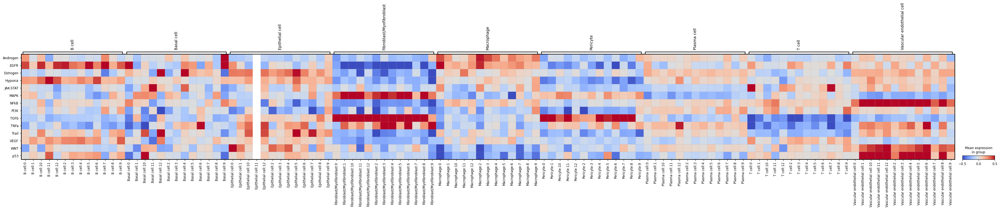

In [43]:
n_clust = 13
ctypes = np.unique(mdat.var.cell_type)
sc.pl.matrixplot(mdat,
                 var_names=mdat.var_names,
                 groupby='name',
                 cmap='coolwarm',
                 var_group_positions=[(13*i,13*(i+1)-1) for i in range(len(ctypes))],
                 var_group_labels=list(ctypes),
                 use_raw=False,
                 vmax=0.5,
                 vmin=-0.5,
                 save='figC.svg'
    )

In [182]:
os.chdir(s_path)
os.listdir(s_path+'figures/')

['figB2.png',
 'matrixplot_figC.svg',
 'figB.svg',
 'umapfigA2.svg',
 'figB3.svg',
 'umapfigA.svg']

In [38]:
ddata.obs['niche'] = ncv_dat.obs.leiden
ddata.uns['niche_colors'] = ncv_dat.uns['leiden_colors']
#ddata.write_h5ad('/gne/data/t3imagedata/conrad_store/VS9_HuLungCa_HF-106315_VS9Library_V11_LH_06-04-2021/HuLung_pipeline_output.h5ad')

# SPEX subfigure D

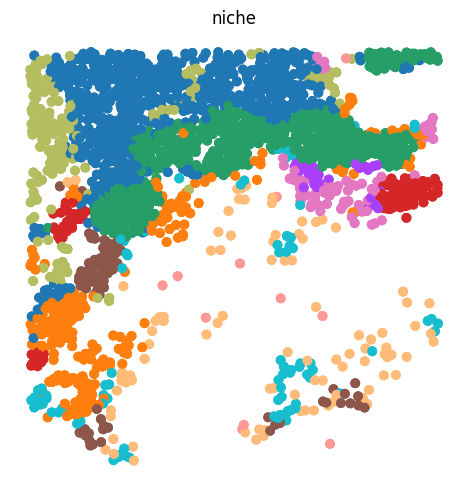

In [18]:
roi1 = ddata[(ddata.obsm['spatial'][:,0] > 2000) & (ddata.obsm['spatial'][:,0] < 3000) & (ddata.obsm['spatial'][:,1] > 2500) & (ddata.obsm['spatial'][:,1] < 3500),:]
sq.pl.spatial_scatter(roi1,color='niche',shape=None,frameon=False,size=150,save='figD_roi1.svg',legend_loc=None)

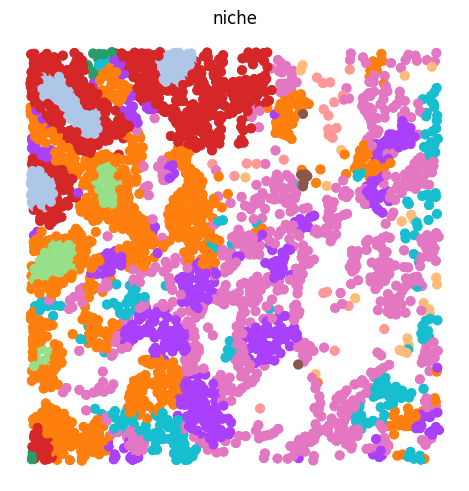

In [19]:
roi2 = ddata[(ddata.obsm['spatial'][:,0] > 3500) & (ddata.obsm['spatial'][:,0] < 4500) & (ddata.obsm['spatial'][:,1] > 5000) & (ddata.obsm['spatial'][:,1] < 6000),:]
sq.pl.spatial_scatter(roi2,color='niche',shape=None,frameon=False,size=150,save='figD_roi2.svg',legend_loc=None)

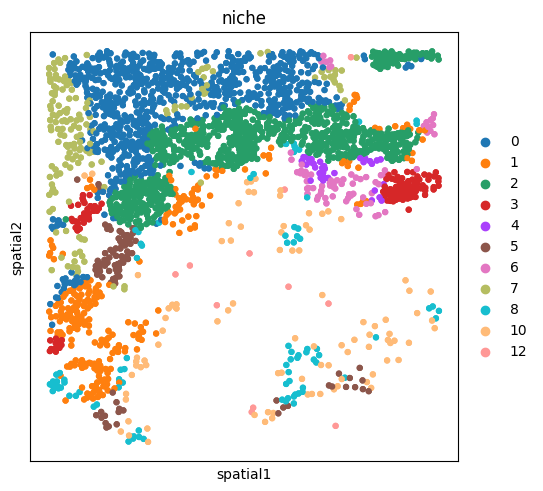

In [248]:
sq.pl.spatial_scatter(roi1,color='niche',shape=None)

In [44]:
ddata.obs['niche_by_type'] = pd.Categorical(ddata.obs['cell_type'].astype('str') + ':' + ddata.obs['niche'].astype('str'))

In [45]:
ddata.layers

Layers with keys: counts, norm_scale

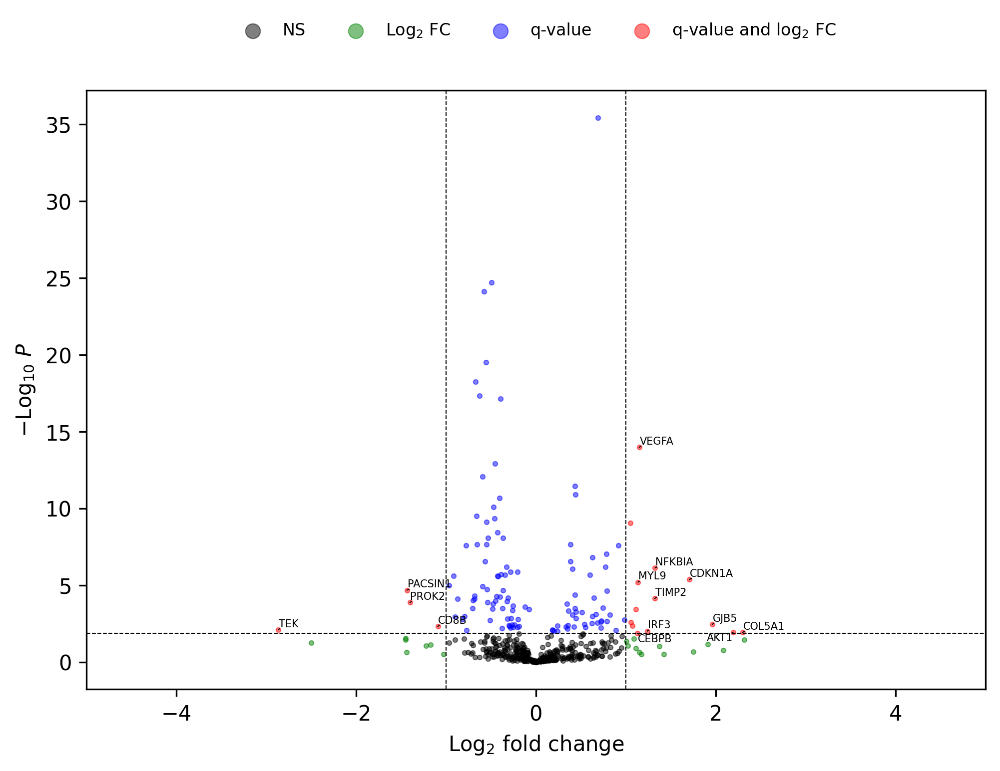

In [46]:
import pegasus as pg
#ddata.layers['counts'] = ddata.raw.to_adata().X.copy()
ddata.X = ddata.layers['counts'].copy()

sc.pp.normalize_total(ddata)
sc.pp.log1p(ddata)

sc.tl.rank_genes_groups(ddata,groupby='niche_by_type',key_added='de_res',use_raw=False,reference='Epithelial cell:4')
de_res = DEResult(ddata,ddata.uns['de_res'],mode='scanpy')
ddata.varm['de_res'] = de_res.convert_to_pegasus()

pg.volcano(ddata,cluster_id='Epithelial cell:6',log2fc_threshold=1,top_n=10)
plt.xlim(-5,5)
plt.show()

(-5.0, 5.0)

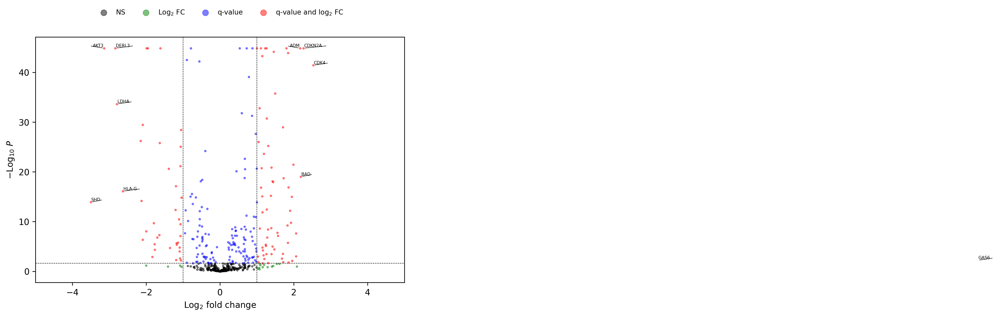

In [47]:
import pegasus as pg
#ddata.layers['counts'] = ddata.raw.to_adata().X.copy()
#ddata.X = ddata.layers['counts'].copy()

#sc.pp.normalize_total(ddata)
#sc.pp.log1p(ddata)

sc.tl.rank_genes_groups(ddata,groupby='niche_by_type',key_added='de_res',use_raw=False,reference='T cell:2')
de_res = DEResult(ddata,ddata.uns['de_res'],mode='scanpy')
ddata.varm['de_res'] = de_res.convert_to_pegasus()

pg.volcano(ddata,cluster_id='T cell:0',log2fc_threshold=1,top_n=5)
plt.xlim(-5,5)

# Structural/morphological analysis

In [9]:
from aicsimageio.readers import OmeTiffReader
import networkx as nx

19-Jun-23 12:34:32 - bfio.backends - WARNING  - Java backend is not available. This could be due to a missing dependency (jpype).


In [10]:
img = OmeTiffReader('/gne/data/t3imagedata/conrad_store/VS9_HuLungCa_HF-106315_VS9Library_V11_LH_06-04-2021/mosaic.ome.tiff')

In [149]:
{x.id.split(':')[-1]:x.name for x in img.ome_metadata.images[0].pixels.channels}

{'0': 'Aux6',
 '1': 'Aux7',
 '2': 'Aux9',
 '3': 'polyT',
 '4': 'Cellbound2',
 '5': 'Aux8',
 '6': 'pS6',
 '7': 'Aux5',
 '8': 'DAPI',
 '9': 'Aux4',
 '10': 'Cellbound1'}

In [154]:
img.ome_metadata.images[0]

Image(
   id='Image:0',
   name='Mosaic',
   pixels=Pixels(
      id='Pixels:0:0',
      dimension_order='XYCZT',
      size_c=11,
      size_t=1,
      size_x=24253,
      size_y=23037,
      size_z=7,
      type='uint16',
      channels=[<11 Channels>],
      physical_size_x=0.325,
      physical_size_y=0.325,
      physical_size_z=1.0,
      tiff_data_blocks=[<1 Tiff_Data_Blocks>],
   ),
)

In [58]:
#Get DAPI max projection
im_arr = img.get_image_dask_data('ZYX',T=0,C=8)
im_max = im_arr.max(axis=0)
mproj = im_max.compute()

In [522]:
tform = np.genfromtxt(d_path + 'images/micron_to_mosaic_pixel_transform.csv',delimiter=' ')
#We downsampled from 60x to 20x
tform = tform/3
tform[2,2] = 1

tform = skim.transform.AffineTransform(matrix=tform)
mproj = skim.transform.warp(mproj, inverse_map=tform)

In [53]:
#First sparsify graph
sq.gr.spatial_neighbors(ddata,coord_type='generic',delaunay=True,radius=50) #radius=50
ddata.obs['barcode'] = ddata.obs.index

#Create graph of only B cells
bcell_dat = ddata[ddata.obs.niche == '0',:]
bcell_graph = nx.from_scipy_sparse_array(bcell_dat.obsp['spatial_connectivities'])

#Add metadata
nx.set_node_attributes(bcell_graph, {x: bcell_dat.obs.iloc[x,:].to_dict() for x in range(bcell_dat.shape[0])})

#Find separated aggregates
aggregates = [bcell_graph.subgraph(c).copy() for c in nx.connected_components(bcell_graph)]

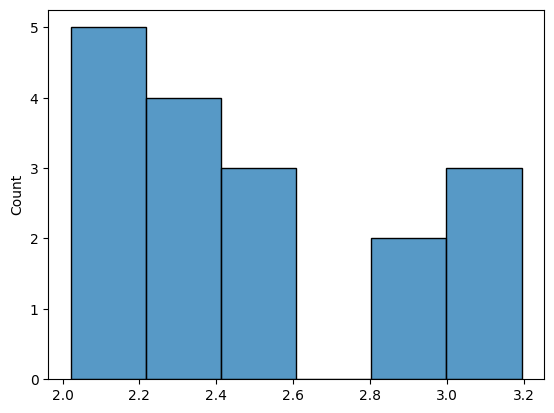

In [54]:
#Filter out singleton and doublet cells
num_nodes = np.array([x.number_of_nodes() for x in aggregates])
true_agg = np.where(num_nodes > 100)[0]

sns.histplot(np.log10(num_nodes[num_nodes > 100]))
plt.show()

In [55]:
agg_list = [aggregates[x] for x in true_agg]

In [56]:
ddata.obs['B cell aggregate'] = '-1'
for i,agg in enumerate(agg_list):
    for n in agg.nodes:
        ddata.obs.loc[ddata.obs.barcode == agg.nodes[n]['barcode'],'B cell aggregate'] = str(i)

In [523]:
ddata.uns['spatial']['1'] = {}
ddata.uns['spatial']['1']['images'] = {'hires':np.concatenate([mproj[:8000,:8000,np.newaxis] for i in range(3)],axis=-1)}
ddata.uns['spatial']['1']['scalefactors'] = {'tissue_hires_scalef': 1, 'spot_diameter_fullres': 50}

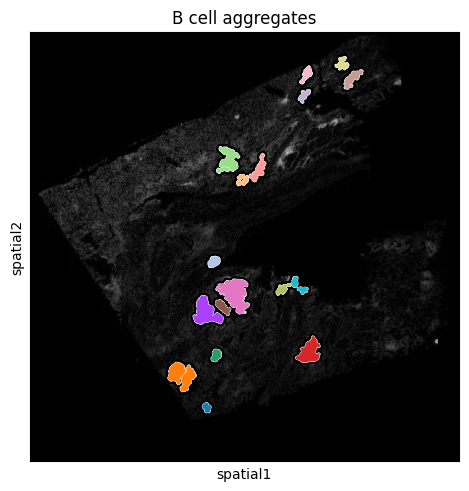

In [716]:
ddata.uns.pop('B cell aggregate_colors')
sq.pl.spatial_scatter(
    ddata,
    color='B cell aggregate',
    groups=[str(x) for x in range(len(agg_list))],
    shape='circle',
    outline=True,
    title='B cell aggregates',
    img=True,
    library_id='1',
    img_cmap='gray',
    img_alpha=0.8,
    alpha=0.5
)
ax = plt.gca()
ax.get_legend().remove()
ax.patch.set_facecolor('black')
#ax.imshow(mproj,alpha=0.5,cmap='jet')
plt.show()

In [427]:
import skimage as skim

#Overlap in x/y space of different masks
def get_convex_hull_mask(tx_df,coord_cols):
    xc = tx_df.loc[:,coord_cols[0]]
    yc = tx_df.loc[:,coord_cols[1]]

    dx = np.round(xc.max()-xc.min()).astype(np.int32)
    dy = np.round(yc.max()-yc.min()).astype(np.int32)
    origin = (np.floor(xc.min()).astype(np.int32),np.floor(yc.min()).astype(np.int32))

    try:
        cell_hull = sp.spatial.ConvexHull(tx_df.loc[:,coord_cols])
        hull_pts = tx_df.iloc[cell_hull.vertices].loc[:,coord_cols]
        
        cmask = skim.draw.polygon2mask(
            (dx+1,dy+1), 
            (hull_pts-origin)
        )
    except:
        print('Error')
        cmask = np.zeros((dx+1,dy+1),np.uint8)
    
    return cmask,np.array(origin)

aggregate_df = pd.DataFrame(columns=['area','perimeter','num_celltypes','num_bcells','num_tcells','avg_tdist','avg_bdist'])
agg_details = {}
for aid in np.unique(ddata.obs['B cell aggregate']):
    if aid == '-1':
        continue

    adata = ddata[ddata.obs['B cell aggregate'] == aid,:]
    acells = adata.obs.copy()
    acells['x'] = np.array(adata.obsm['spatial'][:,0])
    acells['y'] = np.array(adata.obsm['spatial'][:,1])

    cmask,origin = get_convex_hull_mask(acells,['x','y'])
    origin = origin.astype(np.int32)
    
    ptable = skim.measure.regionprops_table(cmask.astype(np.uint8),properties=('area','perimeter','eccentricity','centroid'))
    aggregate_df.loc[aid,'area'] = ptable['area'][0]
    aggregate_df.loc[aid,'perimeter'] = ptable['perimeter'][0]

    ctypes = acells.cell_type.value_counts()
    aggregate_df.loc[aid,'num_celltypes'] = len(ctypes)
    aggregate_df.loc[aid,'num_bcells'] = ctypes['B cell']
    aggregate_df.loc[aid,'num_tcells'] = ctypes['T cell']

    acells['x'] = acells['x'] - origin[0]
    acells['y'] = acells['y'] - origin[1]

    m = skim.measure.moments_coords_central(np.array(acells.loc[:,['x','y']]))
    centroid = (m[1, 0] / m[0, 0], m[0, 1] / m[0, 0])
    acells.loc[:,'d_centroid'] = np.sqrt((acells.loc[:,'x']-centroid[0])**2 + (acells.loc[:,'y']-centroid[1])**2)
    aggregate_df.loc[aid,'min_tdist'] = acells.groupby('cell_type').d_centroid.min()['T cell']
    aggregate_df.loc[aid,'avg_bdist'] = acells.groupby('cell_type').d_centroid.mean()['B cell']
    
    aggregate_df.loc[aid,'eccentricity'] = ptable['eccentricity'][0]

    agg_details[aid] = acells.copy()

In [559]:
adata = ddata[ddata.obs['B cell aggregate'] == '6',:]
acells = adata.obs.copy()
acells['x'] = np.array(adata.obsm['spatial'][:,0])
acells['y'] = np.array(adata.obsm['spatial'][:,1])

cmask,origin = get_convex_hull_mask(acells,['x','y'])

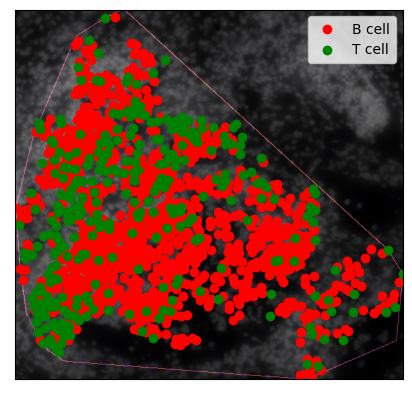

In [560]:
plt.imshow(mproj[origin[1]:(origin[1]+cmask.shape[1]),origin[0]:(origin[0]+cmask.shape[0])].T,cmap='gray')
plt.imshow(skim.feature.canny(cmask),alpha=0.5,cmap='inferno')

plt.scatter(acells.loc[acells.cell_type == 'B cell','y']-origin[1],acells.loc[acells.cell_type == 'B cell','x']-origin[0],c='r',marker='o',label='B cell')
plt.scatter(acells.loc[acells.cell_type == 'T cell','y']-origin[1],acells.loc[acells.cell_type == 'T cell','x']-origin[0],c='g',marker='o',label='T cell')
a = plt.gca()
a.set_xticks([])
a.set_yticks([])
plt.legend()
plt.show()

In [567]:
z = pd.DataFrame()
for a in agg_details:
    if a == '6':
        z = pd.concat([z,agg_details[a]])

In [573]:
z = z.loc[(z.cell_type == 'B cell') | (z.cell_type == 'T cell'),:]
z.cell_type = z.cell_type.astype('str')


In [585]:
z.head()

,fov,volume,min_x,max_x,min_y,max_y,blank_counts,n_genes,n_genes_by_counts,total_counts,leiden,cell_type,niche,B cell aggregate,barcode,x,y,d_centroid
barcodekey,,,,,,,,,,,,,,,,,,
128173339927095456857115687395928114151,361,693.996372,3862.705225,3871.885225,5205.391477,5217.055477,0.0,50,50,96.0,10,T cell,0,6,128173339927095456857115687395928114151,379.295225,588.223477,699.908370
170915041932683167893423997121378783009,361,581.829510,3959.689228,3969.085228,5203.663477,5212.843477,0.0,43,43,56.0,10,T cell,0,6,170915041932683167893423997121378783009,476.387228,585.253477,754.629991
208930557836589964350871591537151141935,361,527.504427,3901.153226,3909.685226,5229.475478,5239.519478,0.0,36,36,46.0,10,T cell,0,6,208930557836589964350871591537151141935,417.419226,611.497478,740.383668
221293721274477522606341291029023208542,361,542.883412,3912.925226,3920.377227,5222.239478,5234.443478,0.0,33,33,53.0,3,B cell,0,6,221293721274477522606341291029023208542,428.651226,605.341478,741.741315
237043481489811182704998523337939948843,361,777.872200,3944.245227,3952.885227,5207.335477,5220.943478,0.0,48,48,84.0,3,B cell,0,6,237043481489811182704998523337939948843,460.565227,591.139477,749.377215


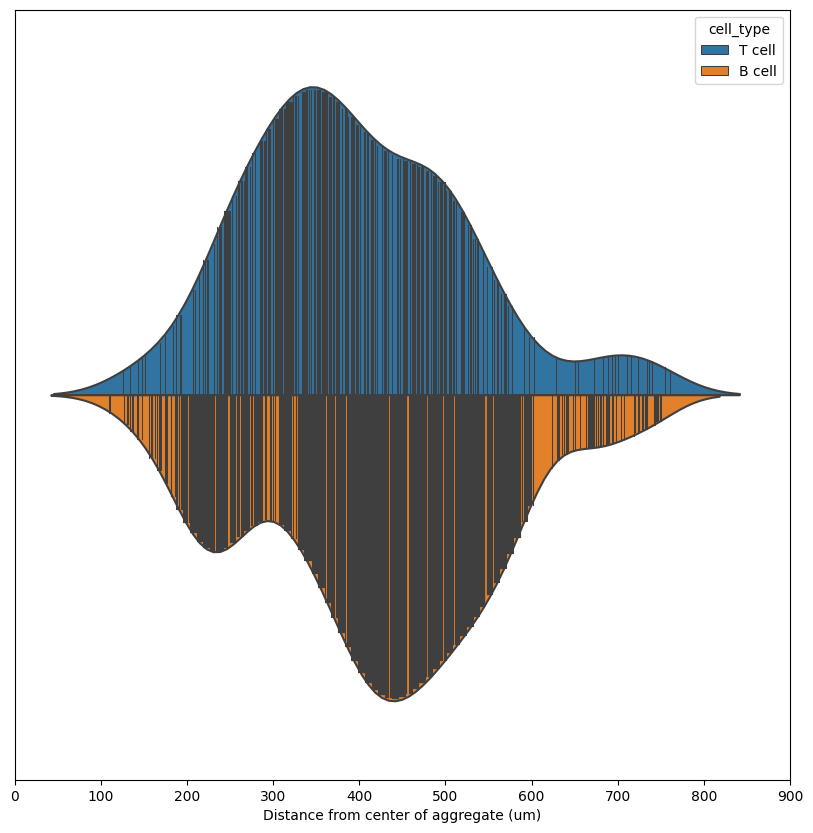

In [588]:
f = plt.figure()
f.set_size_inches(10,10)
sns.violinplot(data=z,
               x='d_centroid',
               y='niche',
               hue='cell_type',
               inner='stick',
               split=True
               #common_bins=True,
               #common_norm=False,
               #element='step',
               #fill=False,
               #stat='probability'
)
a = plt.gca()
a.set_yticks([])

plt.xlabel('Distance from center of aggregate (um)')
plt.ylabel('')
plt.xlim(0,900)
plt.show()

Text(0.5, 0, 'Aggregate area')

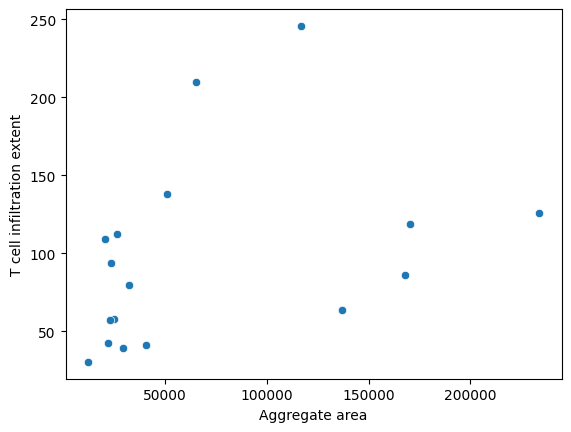

In [409]:
sns.scatterplot(data=aggregate_df,x='area',y='min_tdist')
plt.ylabel('T cell infiltration extent')
plt.xlabel('Aggregate area')

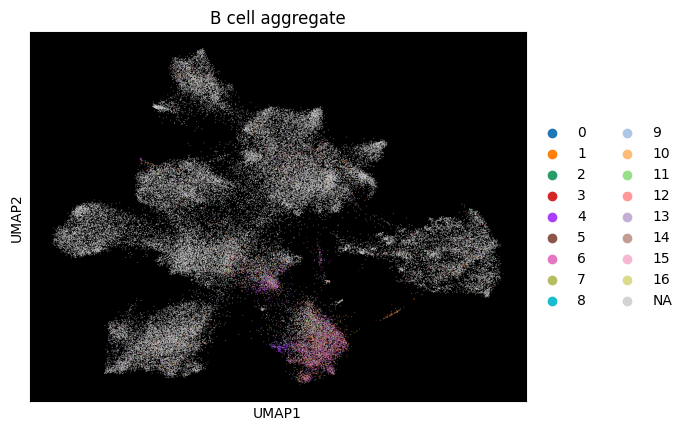

In [411]:
sc.pl.umap(ddata,color='B cell aggregate',groups=[str(x) for x in range(17)],alpha=0.5,show=False)
a = plt.gca()
a.patch.set_facecolor('black')
plt.show()

In [337]:
aggregate_df.loc[aggregate_df.area > 50000,:]

,area,perimeter,num_celltypes,num_bcells,num_tcells,avg_tdist,avg_bdist,min_tdist
1,167868,1717,10,671,148,NaN,304.378535,86.063503
11,136722,1504,10,245,252,NaN,299.961496,63.470122
12,65095,1269,10,134,61,NaN,364.699779,209.678203
14,50779,1141,9,248,38,NaN,216.801055,137.694129
3,116910,1504,10,498,173,NaN,379.164638,245.662218
4,170319,1973,10,915,264,NaN,388.648413,119.039010
6,233748,2101,10,990,301,NaN,423.144008,125.672378


# Ligand/receptor analysis

In [606]:
import cell2cell as c2c

In [608]:
s_path = '/gne/data/t3imagedata/conrad_store/'
ppi = pd.read_csv(s_path + 'PPI_Turei_fixed.csv')
ppi = ppi.loc[(ppi.source != 'UNK') & (ppi.target != 'UNK'),:]

analysis_setup = {
    'communication_score': 'expression_product',
    'cci_score': 'bray_curtis',
    'cci_type': 'directed',
    'complex_sep': '&'
}

In [609]:
measured_genes = ddata.var_names
ppi_dat = pd.DataFrame(columns=['A','B','score'])

for idx,row in ppi.iterrows():
    if row.source in measured_genes and row.target in measured_genes:
        ppi_dat.loc[idx,'A'] = row.source
        ppi_dat.loc[idx,'B'] = row.target
        ppi_dat.loc[idx,'score'] = -1 if row.is_inhibition else 1

In [610]:
ddata.obs['barcode'] = ddata.obs.index

In [611]:
interactions = c2c.analysis.SingleCellInteractions(rnaseq_data=ddata.to_df().T,
                                                   ppi_data=ppi_dat,
                                                   metadata=ddata.obs.copy(),
                                                   interaction_columns=('A','B'),
                                                   communication_score='expression_thresholding',
                                                   cci_score='bray_curtis',
                                                   cci_type='directed',
                                                   aggregation_method='nn_cell_fraction',
                                                   barcode_col='barcode',
                                                   celltype_col='cell_type',
                                                   complex_sep='&',
                                                   verbose=False
                                                   )

In [612]:
interactions.compute_pairwise_communication_scores()
interactions.compute_pairwise_cci_scores()

Computing pairwise communication
Computing communication score between B cell and Macrophage
Computing communication score between Unknown and Unknown
Computing communication score between Unknown and Epithelial cell
Computing communication score between Basal cell and Macrophage
Computing communication score between Plasma cell and Basal cell
Computing communication score between B cell and Basal cell
Computing communication score between T cell and Macrophage
Computing communication score between Basal cell and Basal cell
Computing communication score between Fibroblast/Myofibroblast and B cell
Computing communication score between Fibroblast/Myofibroblast and Vascular endothelial cell
Computing communication score between Pericyte and B cell
Computing communication score between Epithelial cell and Macrophage
Computing communication score between Macrophage and Basal cell
Computing communication score between Macrophage and Plasma cell
Computing communication score between Fibroblas

In [613]:
cci_pvals = interactions.permute_cell_labels(evaluation='interactions',
                                             permutations=100,
                                             fdr_correction=True,
                                             verbose=True)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [01:01<00:00,  1.64it/s]


In [614]:
ccc_pvals = interactions.permute_cell_labels(evaluation='communication',
                                             permutations=100, 
                                             fdr_correction=True,
                                             verbose=True)

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 100/100 [01:08<00:00,  1.46it/s]


Interaction space detected as a Interactions class


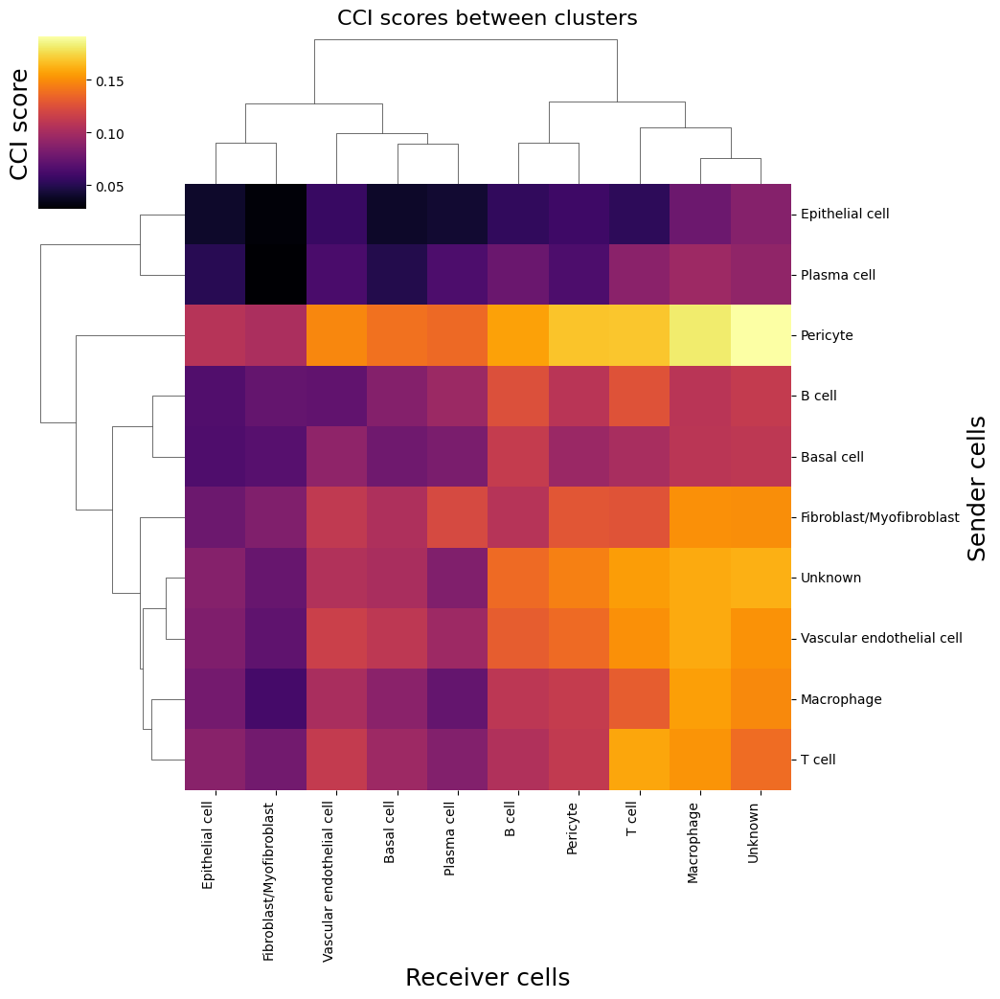

In [615]:
colors = c2c.plotting.get_colors_from_labels(labels=ddata.obs.cell_type.unique().tolist(),
                                             cmap='tab10'
                                            )

cm = c2c.plotting.clustermap_cci(interactions,
                                 method='complete',
                                 colors=colors,
                                 title='CCI scores between clusters',
                                 cmap='inferno')

Interaction space detected as an InteractionSpace class


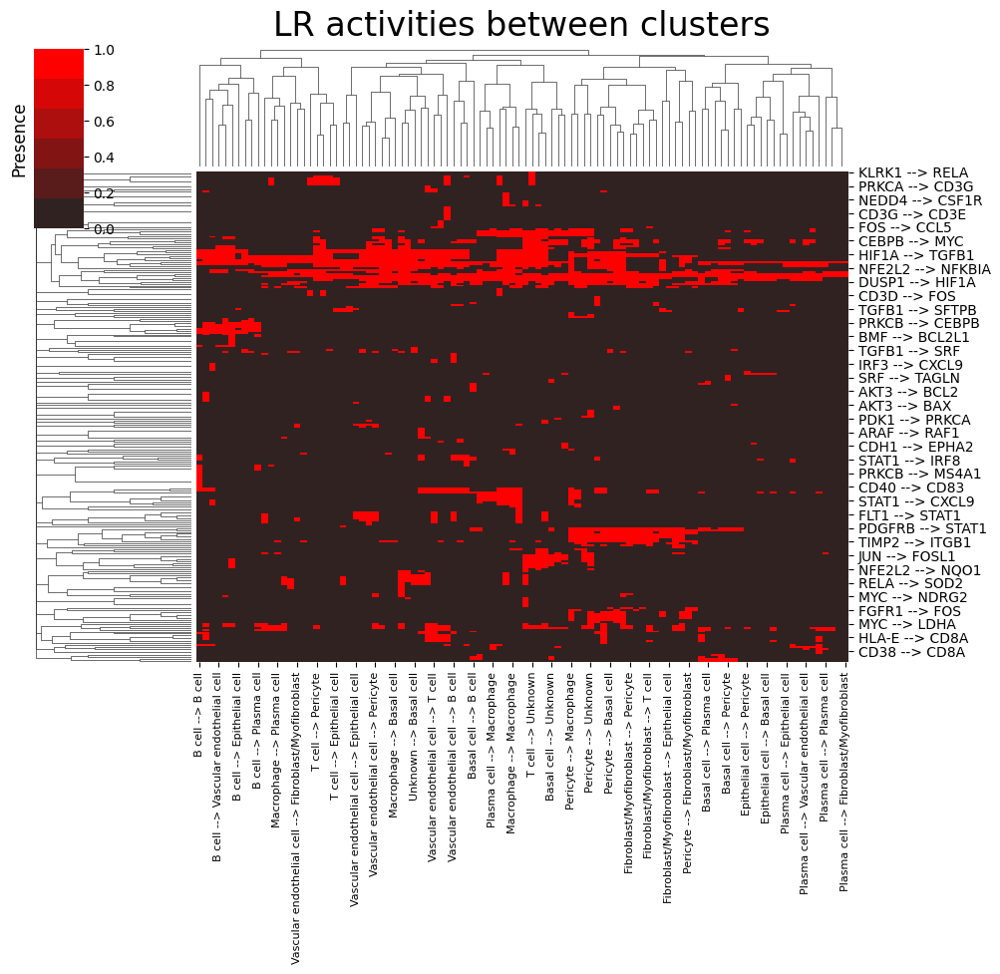

In [616]:
cm = c2c.plotting.clustermap_ccc(interactions,
                                 method='complete',
                                 colors=colors,
                                 title='LR activities between clusters',
                                 )

In [617]:
ccc_mat = interactions.interaction_space.interaction_elements['communication_matrix']
ccc_mat.loc[:,[x for x in ccc_mat.columns if x[:2] == 'T cell']].sum(axis=1)

(NUMB, NOTCH1)    0.0
(ATF3, TP53)      0.0
(IGF1, IGF1R)     0.0
(MYCN, TP53)      0.0
(CDK2, MYC)       0.0
                 ... 
(AGER, KRAS)      0.0
(SRC, FCGR3B)     0.0
(AGER, NRAS)      0.0
(AGER, HRAS)      0.0
(HK2, BAX)        0.0
Length: 1928, dtype: float64

In [719]:
cci_mat = interactions.interaction_space.interaction_elements['cci_matrix']
receive_18_score = cci_mat.loc['Unknown',:] #Sender,receiver
ddata.obs.loc[:,'Input from unknown'] = ddata.obs.cell_type.apply(lambda x: receive_18_score.loc[x])

In [720]:
ddata.obs['Input from unknown'] = ddata.obs['Input from unknown'].astype('float32')
#ddata.obs.loc[ncv_dat.X[:,7] < 1,'Input from unknown'] = 0

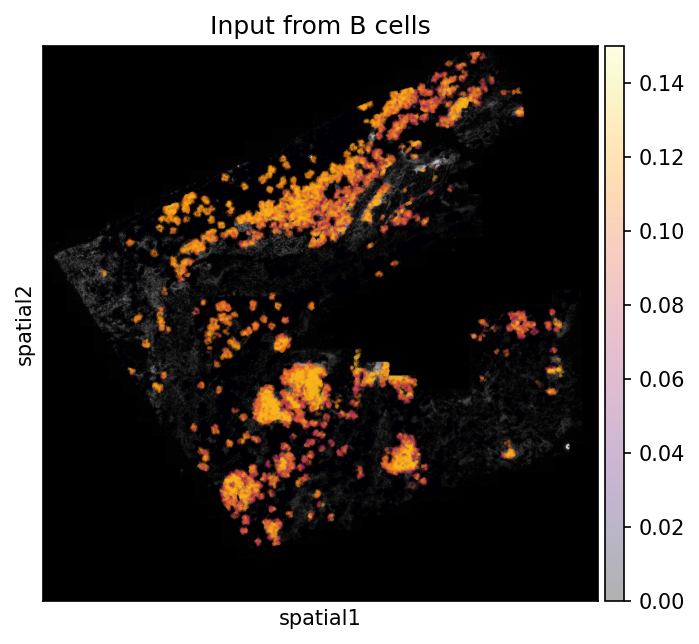

In [713]:
f = plt.figure(dpi=150)
a = plt.gca()

sq.pl.spatial_scatter(ddata, color='Input from B cells', img=True,vmax=0.15,cmap='inferno',alpha=0.3,ax=a)
a.patch.set_facecolor('black')
plt.show()

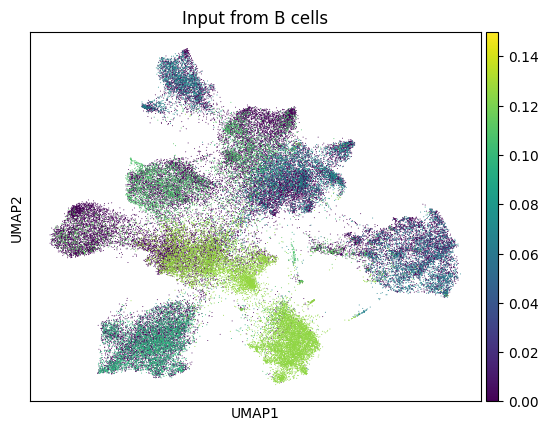

In [715]:
sc.pl.umap(ddata,color='Input from B cells',vmax=0.15)

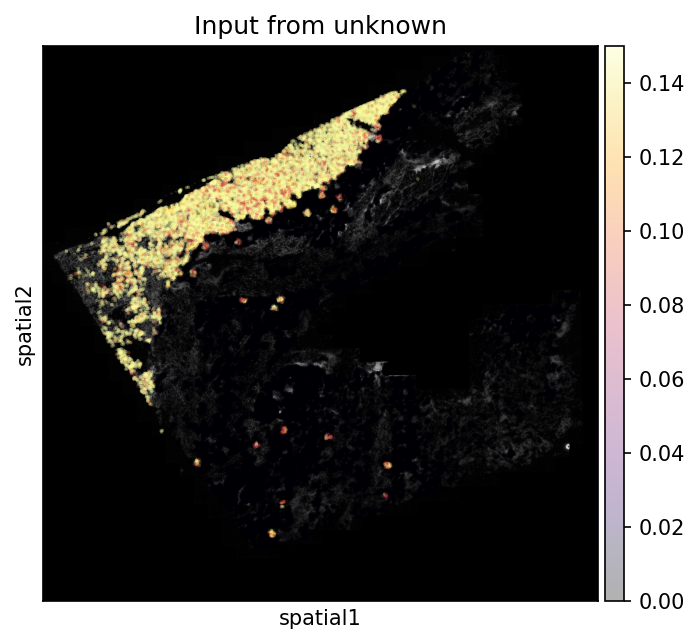

In [718]:
f = plt.figure(dpi=150)
a = plt.gca()

sq.pl.spatial_scatter(ddata, color='Input from unknown', img=True,vmax=0.15,cmap='inferno',alpha=0.3,ax=a)
a.patch.set_facecolor('black')
plt.show()

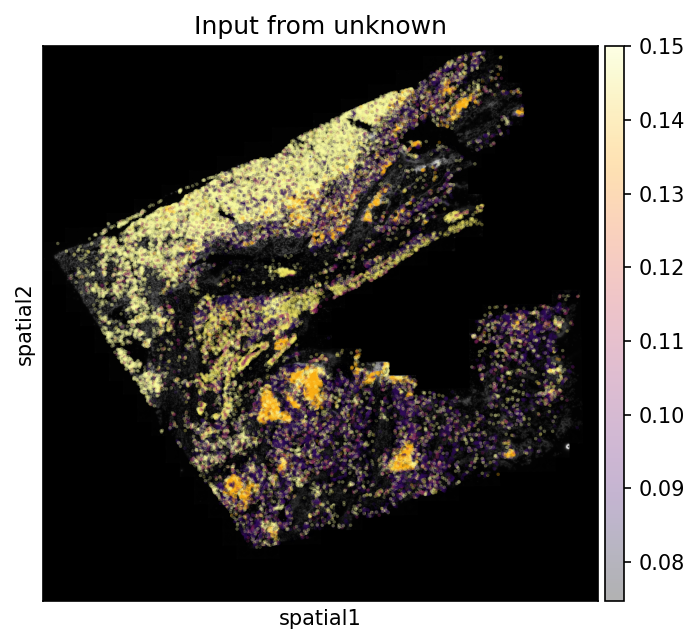

In [721]:
f = plt.figure(dpi=150)
a = plt.gca()

sq.pl.spatial_scatter(ddata, color='Input from unknown', img=True,vmax=0.15,cmap='inferno',alpha=0.3,ax=a)
a.patch.set_facecolor('black')
plt.show()